# Import libs

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import requests
from bs4 import BeautifulSoup
from PIL import Image
import os
from sklearn.preprocessing import FunctionTransformer
from collections import Counter

sns.set_theme()
plt.rcParams["figure.figsize"] = (15,8)
plt.rcParams["figure.dpi"] = 300

In [2]:
plt.rcParams["figure.figsize"] = (15,8)
plt.rcParams["figure.dpi"] = 300

# Pull

In [3]:
# !git clone https://github.com/Tuan-Lee-23/Data-Science-Final-Project.git
# %cd Data-Science-Final-Project/
# %cd notebooks

# Preprocessing + Data exploration

In [4]:
%cd ..

C:\Users\Admin\OneDrive - VNU-HCMUS\Lab KHDL\Pro


In [5]:
df = pd.read_csv('data/raw/tmdb.csv', index_col = 'id', lineterminator= '\n')
df.head(8)

,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,tagline,title,video,vote_average,vote_count,cast,crew,keywords,revenue_,budget
id,,,,,,,,,,,,,,,,,,,,,
619297,False,NaN,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",http://www.netflix.com/title/81058613,tt10731768,en,Sweet Girl,A devastated husband vows to bring justice to ...,580.504,/6KFrffYXYrgszW4FqhGvOEfg9P7.jpg,...,Family fights as one.,Sweet Girl,False,6.8,244,"[{'gender': 2, 'original_name': 'Jason Momoa',...","[{'gender': 2, 'original_name': 'Barry Ackroyd...","[{'id': 1721, 'name': 'fight'}, {'id': 5600, '...",NaN,NaN
602463,False,NaN,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt14941222,ko,인질,"After a film premiere, a famous actor is kidna...",6.465,/tvjfD4Ry8Otin3CCgkmEAxnewcN.jpg,...,NaN,Hostage: Missing Celebrity,False,NaN,0,"[{'gender': 2, 'original_name': 'Hwang Jung-mi...","[{'gender': 2, 'original_name': 'Choi Young-hw...",NaN,5423104.0,5423104.0
849361,False,NaN,"[{'id': 27, 'name': 'Horror'}]",https://dsinmovie.com,tt11589366,en,Don't Say Its Name,"Shortly after Kharis Redwater, a native, anti-...",3.528,/vk5NrEegeKnsjALrTWg54Agaf4u.jpg,...,NaN,Don't Say Its Name,False,3.0,1,"[{'gender': 2, 'original_name': 'Julian Black ...","[{'gender': 0, 'original_name': 'Rueben Martel...",NaN,NaN,NaN
517302,False,NaN,"[{'id': 27, 'name': 'Horror'}]",NaN,tt12519030,fi,Pahanhautoja,Hatching is a horror drama about a young gymna...,4.095,/B7zecDu1oLnSp4IDmcJpGN5Hg0.jpg,...,NaN,Hatching,False,NaN,0,"[{'gender': 0, 'original_name': 'Siiri Solalin...","[{'gender': 1, 'original_name': 'Hanna Berghol...","[{'id': 650, 'name': 'gymnastics'}, {'id': 413...",NaN,4010283.0
844069,False,NaN,"[{'id': 27, 'name': 'Horror'}, {'id': 53, 'nam...",NaN,tt14922584,ko,귀문,"In 1990, at a secluded community center, the c...",23.936,/zD3DvlwJbGv0QkNrTNmsve6jvcl.jpg,...,"All May Enter, None Shall Return",Guimoon: The Lightless Door,False,NaN,0,"[{'gender': 2, 'original_name': 'Kim Kang-woo'...","[{'gender': 0, 'original_name': 'Sim Deok-geun...",NaN,NaN,NaN
760154,False,NaN,"[{'id': 35, 'name': 'Comedy'}, {'id': 10749, '...",NaN,tt11594766,pt,Diários de Intercâmbio,Two best friends embark on a life-changing adv...,33.987,/uplRglTsJn6lCMP3gda8nyQdTb0.jpg,...,NaN,The Secret Diary of an Exchange Student,False,6.7,32,"[{'gender': 1, 'original_name': 'Larissa Manoe...","[{'gender': 2, 'original_name': 'Bruno Garotti...",NaN,NaN,NaN
848144,False,NaN,"[{'id': 18, 'name': 'Drama'}]",https://filmsdulosange.com/en/film/lhorizon/,tt10768264,fr,L'horizon,"On the northern outskirts of Paris, where hous...",3.113,/xQitmqwbwGC0AFdrWeu0vbnMjcU.jpg,...,NaN,The Horizon,False,NaN,0,"[{'gender': 1, 'original_name': 'Tracy Gotoas'...","[{'gender': 0, 'original_name': 'Emilie Carpen...",NaN,NaN,NaN
736737,False,NaN,"[{'id': 18, 'name': 'Drama'}]",NaN,tt11815154,en,Sunburn,"In the wake of a tragedy, Charlie takes her be...",3.118,/qjFwyenC2Rb1amXcwILPPvh62aB.jpg,...,A friendship can be the love of your life,Sunburn,False,NaN,0,"[{'gender': 3, 'original_name': 'Zoe Terakes',...","[{'gender': 0, 'original_name': 'Jaslyn Mairs'...","[{'id': 270, 'name': 'ocean'}, {'id': 966, 'na...",NaN,2194.0


## Inspecting

In [6]:
print(df.shape)
pd.DataFrame(df.dtypes).sort_values(0)

(12199, 26)


,0
adult,bool
video,bool
vote_count,int64
vote_average,float64
runtime,float64
revenue_,float64
popularity,float64
budget,float64
original_title,object
keywords,object


### Check Duplication

In [7]:
df.index.duplicated().sum()

0

### Feature interpretation

In [8]:
with open("data/raw/description.txt") as f:
    print(f.read())

Data Description id - Integer unique id of each movie

belongs_to_collection - Contains the TMDB Id, Name, Movie Poster and Backdrop URL of a movie in JSON format. You can see the Poster and Backdrop Image like this: https://image.tmdb.org/t/p/original/. Example: https://image.tmdb.org/t/p/original//iEhb00TGPucF0b4joM1ieyY026U.jpg

budget: Budget of a movie in dollars

genres : Contains all the Genres Name & TMDB Id in JSON Format

homepage - Contains the official homepage URL of a movie. Example: http://sonyclassics.com/whiplash/ , this is the homepage of Whiplash movie.

imdb_id - IMDB id of a movie (string). You can visit the IMDB Page like this: https://www.imdb.com/title/

original_language - Two digit code of the original language, in which the movie was made. Like: en = English, fr = french.

original_title - The original title of a movie. Title & Original title may differ, if the original title is not in English.

overview - Brief description of the movie.

popularity - Popular

## Basic cleaning

### Correct dtypes

Convert **release_date** from object to datetime

In [9]:
df['release_date'] = pd.to_datetime(df['release_date'])

Let's check dtypes again

In [10]:
temp = pd.DataFrame({'type': df.dtypes}).sort_values(['type']).T
display(temp)

,adult,video,vote_count,vote_average,runtime,revenue_,popularity,release_date,budget,keywords,...,original_title,status,spoken_languages,imdb_id,original_language,production_countries,production_companies,poster_path,overview,tagline
type,bool,bool,int64,float64,float64,float64,float64,datetime64[ns],float64,object,...,object,object,object,object,object,object,object,object,object,object


$\Rightarrow$ All Features are in the correct dtypes

### Clean features have dictionary values

In [11]:
pd.set_option('display.max_colwidth', None)

In [12]:
cols = ['genres', 'production_companies', 'production_countries', 'spoken_languages', 'cast', 'crew', 'keywords']

def clean_genres_dict(val, col):
    if pd.isna(val):
        return np.nan
    else:
        res = []
        items =  eval(str(val))
        if col == 'genres' or col == 'companies' or col == 'countries':
            res = [item['name'] for item in items]
        elif col == 'languages':
            res = [item['english_name'] for item in items]
        elif col == 'cast':
            res = [[item['original_name'], item['gender'], item['popularity'], item['character']] for item in items]
        elif col == 'crew':
            res = [[item['original_name'], item['gender'], item['popularity'], item['job']] for item in items]
        elif col == 'keywords':
            res = [item['name'] for item in items]


        return res


# def clean_production_companies(val):

df['genres'] =df['genres'].apply(lambda x: clean_genres_dict(x, 'genres'))
df['production_companies'] =df['production_companies'].apply(lambda x: clean_genres_dict(x, 'companies'))
df['production_countries'] =df['production_countries'].apply(lambda x: clean_genres_dict(x, 'countries'))
df['spoken_languages'] =df['spoken_languages'].apply(lambda x: clean_genres_dict(x, 'languages'))
df['cast'] =df['cast'].apply(lambda x: clean_genres_dict(x, 'cast'))
df['crew'] =df['crew'].apply(lambda x: clean_genres_dict(x, 'crew'))
df['keywords'] =df['keywords'].apply(lambda x: clean_genres_dict(x, 'keywords'))
df.head()

,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,tagline,title,video,vote_average,vote_count,cast,crew,keywords,revenue_,budget
id,,,,,,,,,,,,,,,,,,,,,
619297,False,NaN,"[Action, Thriller, Drama]",http://www.netflix.com/title/81058613,tt10731768,en,Sweet Girl,"A devastated husband vows to bring justice to the people responsible for his wife's death while protecting the only family he has left, his daughter.",580.504,/6KFrffYXYrgszW4FqhGvOEfg9P7.jpg,...,Family fights as one.,Sweet Girl,False,6.8,244,"[[Jason Momoa, 2, 43.969, Ray Cooper], [Isabela Merced, 1, 48.783, Rachel Cooper], [Manuel Garcia-Rulfo, 2, 6.49, Amo Santos], [Amy Brenneman, 1, 9.139, Diana Morgan], [Adria Arjona, 1, 14.456, Amanda Cooper]]","[[Barry Ackroyd, 2, 1.4, Director of Photography], [Brian Andrew Mendoza, 0, 1.171, Director]]","[fight, daughter, father, truth, safe, escape, justice, family, death, parents, kid, drug, life, girl]",NaN,NaN
602463,False,NaN,"[Action, Thriller]",NaN,tt14941222,ko,인질,"After a film premiere, a famous actor is kidnapped in the middle of Seoul. Thinking it is a prank, the actor is relaxed, but when he faces cruelty, he realises the gravity of the situation. He tries to find an escape route as kidnappers demand a huge ransom within 24 hours. Then the struggle begins, which is very different from what he has seen in films.",6.465,/tvjfD4Ry8Otin3CCgkmEAxnewcN.jpg,...,NaN,Hostage: Missing Celebrity,False,NaN,0,"[[Hwang Jung-min, 2, 4.056, Hwang Jung-min], [Kim Jae-bum, 2, 0.648, ], [Lee You-mi, 1, 1.4, ], [Ryu Kyung-soo, 2, 5.807, ], [Lee Ho-jung, 1, 0.6, ]]","[[Choi Young-hwan, 2, 0.732, Director of Photography], [Pil Gam-seong, 0, 0.6, Director]]",NaN,5423104.0,5423104.0
849361,False,NaN,[Horror],https://dsinmovie.com,tt11589366,en,Don't Say Its Name,"Shortly after Kharis Redwater, a native, anti-mining activist is killed in a mysterious hit and run, horrific, seemingly random murders start occurring in the snowfields of Kharis’ isolated reserve.",3.528,/vk5NrEegeKnsjALrTWg54Agaf4u.jpg,...,NaN,Don't Say Its Name,False,3.0,1,"[[Julian Black Antelope, 2, 1.153, Carson], [Samuel Marty, 2, 3.755, Ben], [Sera-Lys McArthur, 0, 1.052, Stacey], [Madison Walsh, 0, 0.6, Betty], [Tom Carey, 2, 1.4, Donny]]","[[Rueben Martell, 0, 0.6, Director]]",NaN,NaN,NaN
517302,False,NaN,[Horror],NaN,tt12519030,fi,Pahanhautoja,"Hatching is a horror drama about a young gymnast girl Tinja, who tries desperately to please her mother, a woman obsessed with presenting the image of a perfect family life to the whole world through her popular blog. Then, one night, Tinja finds a strange egg. She hides it, she keeps it warm. And when it hatches, what emerges is beyond belief.",4.095,/B7zecDu1oLnSp4IDmcJpGN5Hg0.jpg,...,NaN,Hatching,False,NaN,0,"[[Siiri Solalinna, 0, 0.728, Tinja], [Sophia Heikkilä, 0, 0.828, Mother], [Jani Volanen, 2, 3.793, Father], [Reino Nordin, 2, 0.6, Tero], [Oiva Ollila, 0, 0.6, Matias]]","[[Hanna Bergholm, 1, 0.6, Director]]","[gymnastics, bird hatching, family conflict]",NaN,4010283.0
844069,False,NaN,"[Horror, Thriller]",NaN,tt14922584,ko,귀문,"In 1990, at a secluded community center, the custodian murders all the guest lodgers and kills himself. Ever since, on every Old Year's Night, paranormal events begin to take place within the building. Eventually, the center is shut down and left abandoned for years. A renowned paranormal investigator who had lost his mother during an exorcism and three college students who heard about the rumor of the unexplained phenomena heads over to the building, resolved to uncover the buried secret.",23.936,/zD3DvlwJbGv0QkNrTNmsve6jvcl.jpg,...,"All May Enter, None Shall Return",Guimoon: The Lightless Door,False,NaN,0,"[[Kim Kang-woo, 2, 4.313, ], [Kim So-hye, 1, 0.6, ], [Lee Jung-hyoung, 2, 0.6, ], [Hong Jin-gi, 2, 0.6, ]]","[[Sim Deok-geun, 0, 0.6, Director]]",NaN,NaN,NaN


## Explore movies (Just for fun)

#### Top 20 Highest-Grossing Movies of All Time'

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


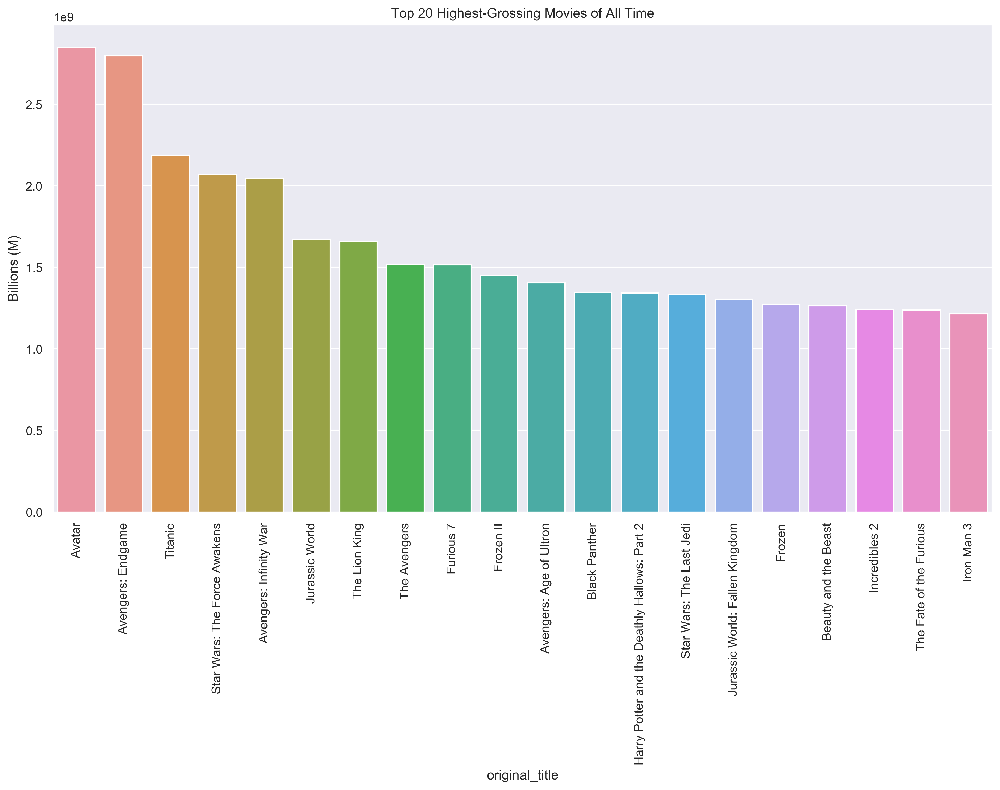

In [13]:
temp = df.sort_values('revenue_', ascending = False).head(20)
sns.barplot(temp.original_title, temp.revenue_)
plt.xticks(rotation = 90)
plt.ylabel('Billions (M)')
plt.title('Top 20 Highest-Grossing Movies of All Time')
plt.show()

#### Top 10 Most Expensive Movies Of All Time

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 38713 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 38722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 28779 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:180: RuntimeWarning: Glyph 38713 missing from current font.
  font.set_t

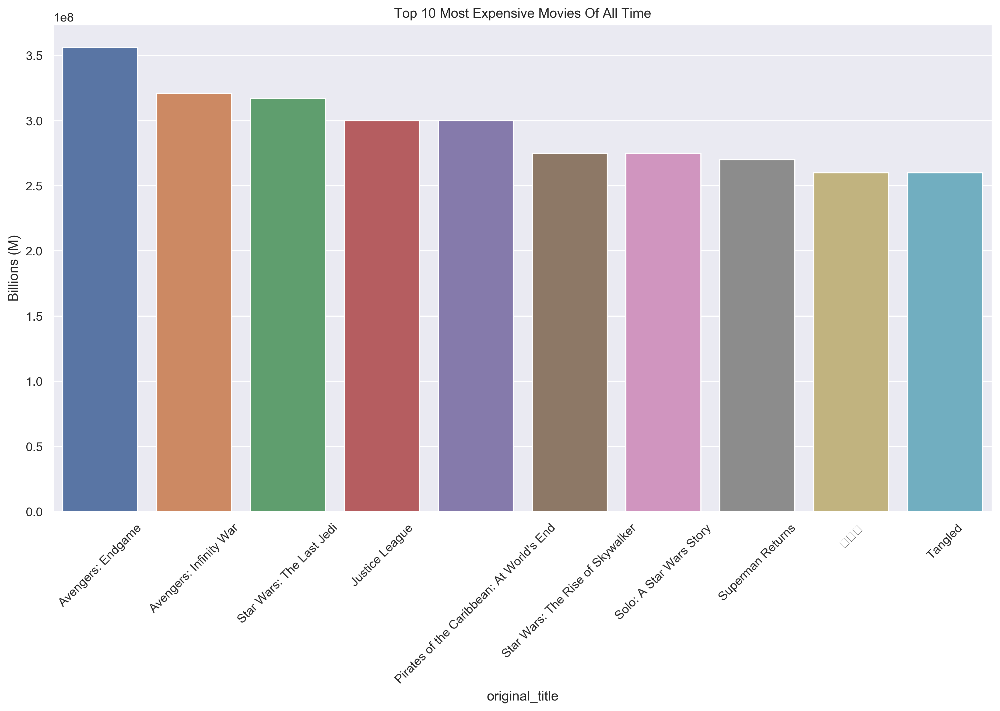

In [14]:
temp = df.sort_values('budget', ascending = False).head(10)
sns.barplot(temp.original_title, temp.budget)
plt.xticks(rotation = 45)
plt.ylabel('Billions (M)')
plt.title('Top 10 Most Expensive Movies Of All Time')
plt.show()

#### Top 20 Longest Movies of All Time'

In [15]:
temp = df.sort_values('runtime', ascending = False).head(20)
display(temp[['original_title', 'runtime']])

,original_title,runtime
id,,
45560,Berlin Alexanderplatz,902.0
222724,Crystal Lake Memories: The Complete History of Friday the 13th,400.0
11659,La meglio gioventù,366.0
3870,Novecento,317.0
10655,Gettysburg,271.0
8095,Cleopatra,248.0
414419,Kill Bill: The Whole Bloody Affair,247.0
791373,Zack Snyder's Justice League,242.0
10549,Hamlet,242.0


#### Top 20 Highest-Rating Movies of All Time'

In [16]:
temp = df.sort_values('vote_average', ascending = False).head(20)
display(temp[['original_title', 'vote_average']])

,original_title,vote_average
id,,
786568,Toy Story 3 in Real Life,10.0
849591,Halo: The Fall of Reach,9.5
329824,Ebola Zombies,9.5
739936,French Lolita,9.3
820232,鬼滅の刃 兄妹の絆,9.3
730647,브레이크 더 사일런스: 더 무비,9.2
529414,Franco Escamilla: Por La Anécdota,9.2
657847,Mr. Robot: Behind the Mask,9.1
753230,Las tres muertes de Marisela Escobedo,9.0


#### Top 10 Trending Movies of (August 2021)'

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


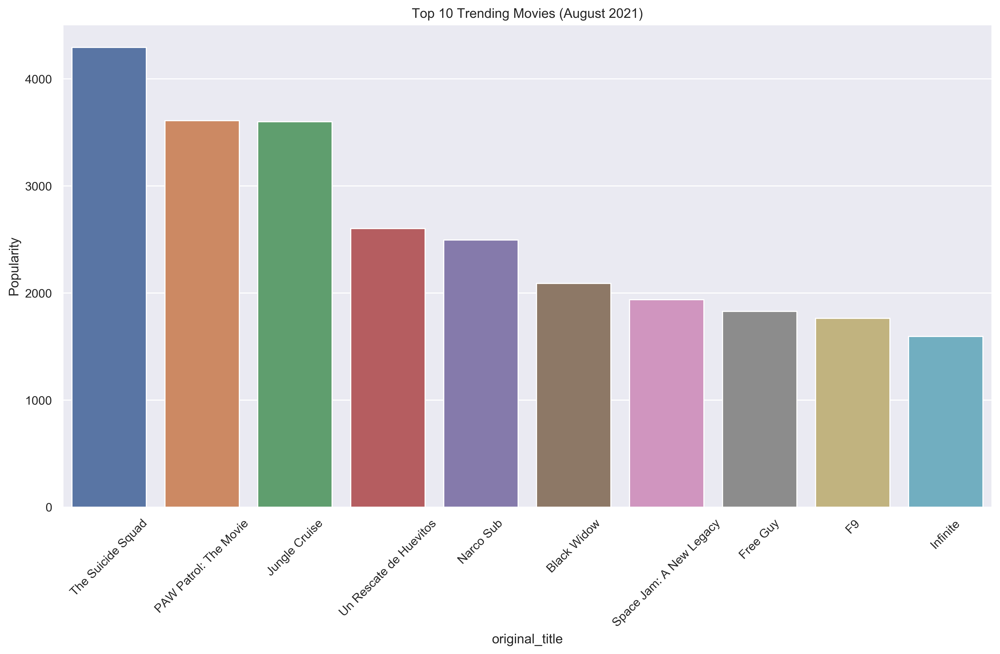

In [17]:
temp = df.sort_values('popularity', ascending = False).head(10)
sns.barplot(temp.original_title, temp.popularity)
plt.xticks(rotation = 45)
plt.ylabel('Popularity')
plt.title('Top 10 Trending Movies (August 2021)')
plt.show()

#### Top 5 Oldest Movies (From database)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


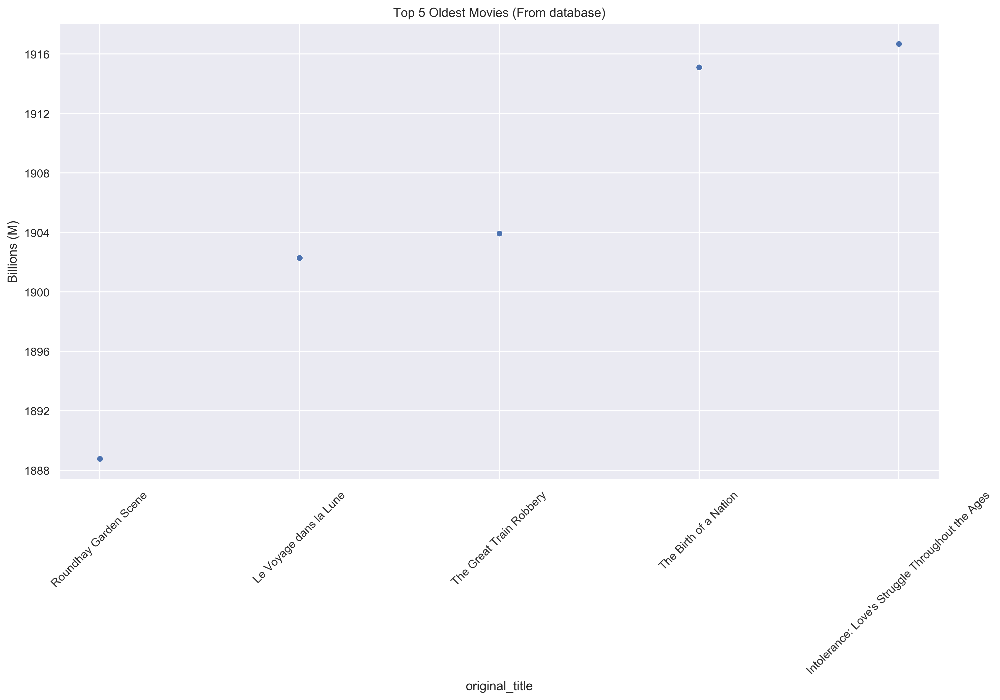

In [18]:
temp = df.sort_values('release_date').head(5)
sns.scatterplot(temp.original_title, temp.release_date)
plt.xticks(rotation = 45)
plt.ylabel('Billions (M)')
plt.title('Top 5 Oldest Movies (From database)')
plt.show()

#### The 10 Highest Grossing Actors of All-Time

In [19]:
temp = df[['cast', 'vote_average', 'budget', 'revenue_']]
temp = temp.dropna(subset = ['vote_average', 'budget', 'revenue_'])
temp = temp.explode('cast')

def treat_cast(val):
    try:
        return val[0]
    except:
        return np.nan

def treat_cast1(val):
    try:
        return val[1]
    except:
        return np.nan

def treat_cast2(val):
    try:
        return val[2]
    except:
        return np.nan

def treat_cast3(val):
    try:
        return val[3]
    except:
        return np.nan

def display_cast(name):
    global count
    url = 'https://vi.wikipedia.org/wiki/' + "_".join(name.split())
    r = requests.get(url)
    soup = BeautifulSoup(r.text, 'html.parser')
    
    # img_link = soup.select('#mw-content-text > div.mw-parser-output > table.infobox.biography.vcard > tbody > tr:nth-of-type(2) > td > a > img')[0]['src']
    img_link = soup.find('img')['src']
    response = requests.get(f'https:{img_link}')

    # importing modules
    import urllib.request
    import matplotlib.image as mpimg
    
    urllib.request.urlretrieve(f"https:{img_link}", "img.jpg")
    img = mpimg.imread('img.jpg')
    plt.figure(figsize = (5, 3))
    plt.gcf().set_dpi(100)
    imgplot = plt.imshow(img)

    plt.axis('off')
    plt.title(name)
    plt.show()

temp['name'] = temp['cast'].apply(treat_cast)
temp['gender'] = temp['cast'].apply(treat_cast1)
temp['popularity'] = temp['cast'].apply(treat_cast2)
temp['character'] = temp['cast'].apply(treat_cast3)
temp = temp.dropna()


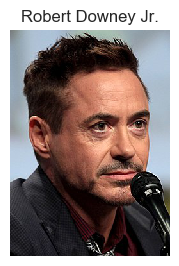

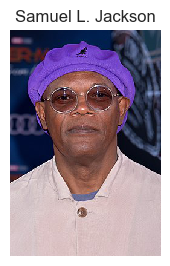

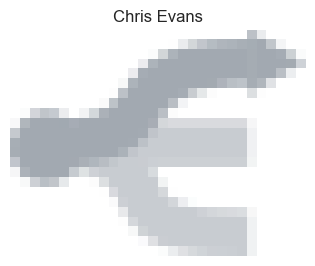

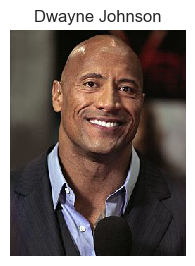

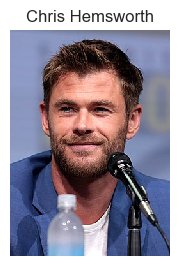

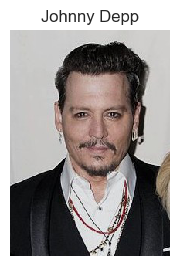

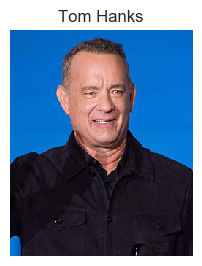

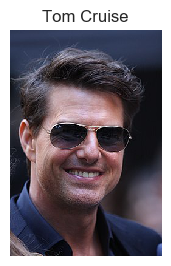

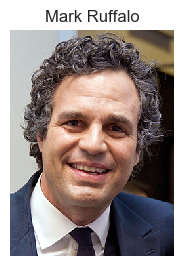

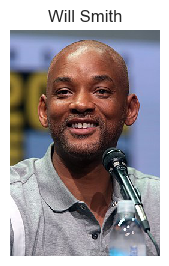

,name,revenue_
0,Robert Downey Jr.,1.459505e+10
1,Samuel L. Jackson,1.167806e+10
2,Chris Evans,1.156526e+10
3,Dwayne Johnson,1.137446e+10
4,Chris Hemsworth,1.116755e+10
5,Johnny Depp,1.066610e+10
6,Tom Hanks,1.064165e+10
7,Tom Cruise,1.049898e+10
8,Mark Ruffalo,9.836924e+09
9,Will Smith,9.477434e+09


In [20]:
gender = 2
top_cast_df = temp[temp['gender'] == gender]
top_cast_df = pd.DataFrame(top_cast_df.groupby(['name'])['revenue_'].sum().sort_values(ascending = False)).head(10)
top_cast_df = top_cast_df.reset_index()
_ = top_cast_df.name.apply(display_cast)
display(top_cast_df)


#### The 10 Highest Grossing Actress of All-Time

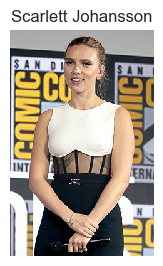

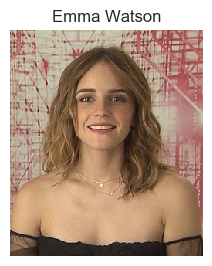

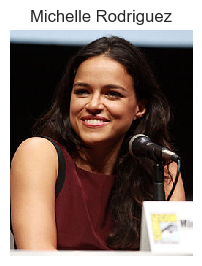

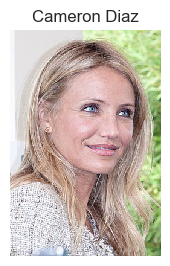

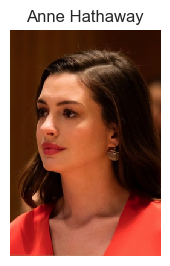

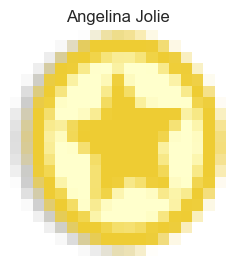

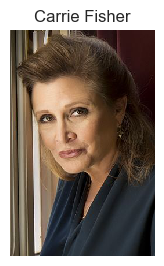

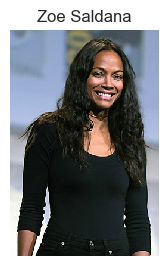

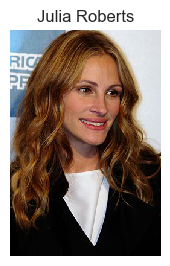

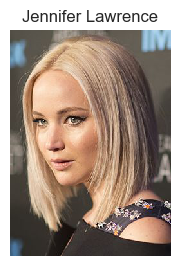

,name,revenue_
0,Scarlett Johansson,1.469975e+10
1,Emma Watson,9.730922e+09
2,Michelle Rodriguez,8.308009e+09
3,Cameron Diaz,7.064622e+09
4,Anne Hathaway,6.754784e+09
5,Angelina Jolie,6.526952e+09
6,Carrie Fisher,6.526804e+09
7,Zoe Saldana,6.204332e+09
8,Julia Roberts,5.983636e+09
9,Jennifer Lawrence,5.750903e+09


In [21]:
gender = 1
top_cast_df = temp[temp['gender'] == gender]
top_cast_df = pd.DataFrame(top_cast_df.groupby(['name'])['revenue_'].sum().sort_values(ascending = False)).head(10)
top_cast_df = top_cast_df.reset_index()
_ = top_cast_df.name.apply(display_cast)
display(top_cast_df)


#### Top 10 blockbuster actors

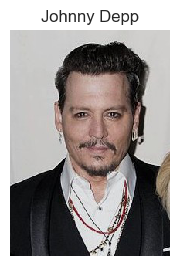

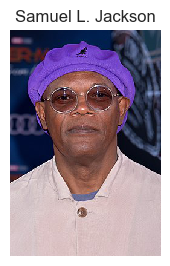

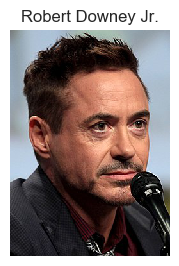

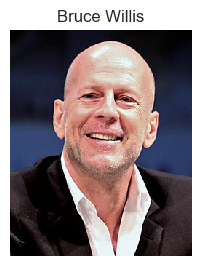

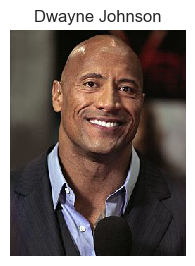

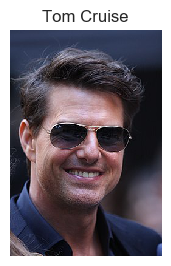

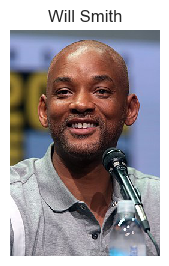

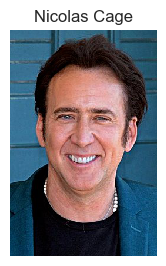

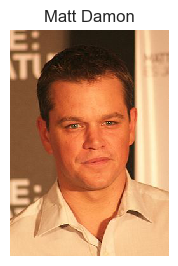

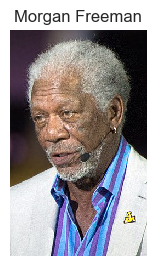

,name,budget
0,Johnny Depp,3.695231e+09
1,Samuel L. Jackson,3.506664e+09
2,Robert Downey Jr.,3.291473e+09
3,Bruce Willis,2.966526e+09
4,Dwayne Johnson,2.932000e+09
5,Tom Cruise,2.869500e+09
6,Will Smith,2.772100e+09
7,Nicolas Cage,2.671199e+09
8,Matt Damon,2.648587e+09
9,Morgan Freeman,2.617178e+09


In [22]:
gender = 2
top_cast_df = temp[temp['gender'] == gender]
top_cast_df = pd.DataFrame(top_cast_df.groupby(['name'])['budget'].sum().sort_values(ascending = False)).head(10)

top_cast_df = top_cast_df.reset_index()

top_cast_df.name.apply(display_cast)
display(top_cast_df)

#### Top 10 blockbuster actress

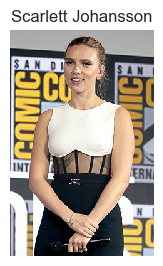

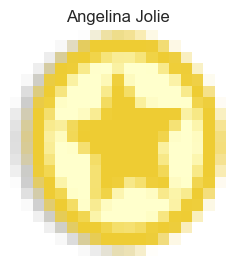

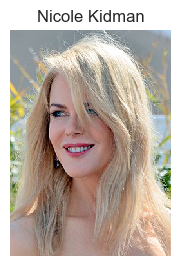

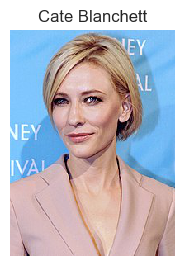

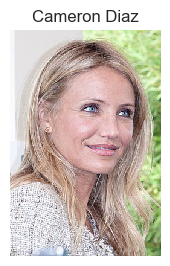

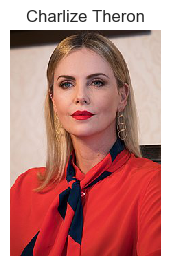

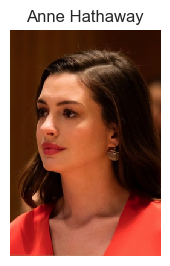

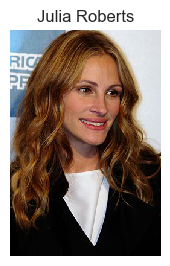

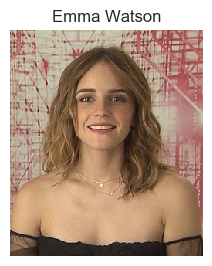

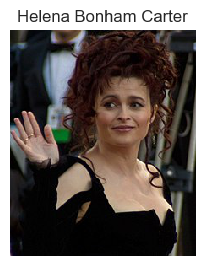

,name,budget
0,Scarlett Johansson,3.175564e+09
1,Angelina Jolie,2.461532e+09
2,Nicole Kidman,2.116388e+09
3,Cate Blanchett,1.977410e+09
4,Cameron Diaz,1.843081e+09
5,Charlize Theron,1.807146e+09
6,Anne Hathaway,1.689680e+09
7,Julia Roberts,1.678500e+09
8,Emma Watson,1.674466e+09
9,Helena Bonham Carter,1.614385e+09


In [23]:
gender = 1
top_cast_df = temp[temp['gender'] == gender]
top_cast_df = pd.DataFrame(top_cast_df.groupby(['name'])['budget'].sum().sort_values(ascending = False)).head(10)

top_cast_df = top_cast_df.reset_index()

top_cast_df.name.apply(display_cast)
display(top_cast_df)

#### Top 10 characters actors of all time

In [24]:
top_chars = pd.DataFrame(temp.groupby(['name', 'character'])['revenue_'].sum().sort_values(ascending = False)).head(10)
top_chars = top_chars.reset_index()

top_chars['name'] =  + top_chars['character'] + ' - ' + top_chars['name']
display(top_chars[['name', 'revenue_']])


,name,revenue_
0,Tony Stark / Iron Man - Robert Downey Jr.,1.222564e+10
1,Steve Rogers / Captain America - Chris Evans,1.000689e+10
2,Natasha Romanoff / Black Widow - Scarlett Johansson,1.000613e+10
3,Thor Odinson - Chris Hemsworth,9.716135e+09
4,Ron Weasley - Rupert Grint,7.706879e+09
5,Hermione Granger - Emma Watson,7.706879e+09
6,Harry Potter - Daniel Radcliffe,7.706879e+09
7,Gandalf - Ian McKellen,5.852068e+09
8,Dominic Toretto - Vin Diesel,5.435489e+09
9,Luke Skywalker - Mark Hamill,5.028866e+09


#### Top 10 characters (highest revenue) of all time

In [25]:
top_chars = temp[temp['gender'] == 1]
top_chars = pd.DataFrame(top_chars.groupby(['character'])['revenue_'].sum().sort_values(ascending = False)).head(10)
top_chars = top_chars.reset_index()

display(top_chars)

,character,revenue_
0,Natasha Romanoff / Black Widow,1.000613e+10
1,Hermione Granger,7.706879e+09
2,General Leia Organa,4.474908e+09
3,Rey,4.474908e+09
4,May Parker,3.617570e+09
5,Bella Swan,3.343107e+09
6,Lois Lane,3.186663e+09
7,Claire Dearing,2.975173e+09
8,Princess Fiona (voice),2.968173e+09
9,Katniss Everdeen,2.944163e+09


#### The 20 Highest Grossing Director - Screenplay of All-Time

In [26]:
temp = df[['crew', 'vote_average', 'budget', 'revenue_']]
temp = temp.dropna(subset = ['vote_average', 'budget', 'revenue_'])
temp = temp.explode('crew')


temp['name'] = temp['crew'].apply(treat_cast)
temp['gender'] = temp['crew'].apply(treat_cast1)
temp['popularity'] = temp['crew'].apply(treat_cast2)
temp['job'] = temp['crew'].apply(treat_cast3)
temp = temp.dropna()

In [27]:
top_chars = pd.DataFrame(temp.groupby(['name', 'job'])['revenue_'].sum().sort_values(ascending = False)).head(20)
top_chars = top_chars.reset_index()

display(top_chars)

,name,job,revenue_
0,Steven Spielberg,Director,1.045067e+10
1,Stephen McFeely,Screenplay,9.394915e+09
2,Christopher Markus,Screenplay,9.394915e+09
3,Andrew Lesnie,Director of Photography,8.619159e+09
4,Dariusz Wolski,Director of Photography,7.680814e+09
5,Steve Kloves,Screenplay,7.578452e+09
6,John Schwartzman,Director of Photography,7.332944e+09
7,Trent Opaloch,Director of Photography,7.313463e+09
8,Don Burgess,Director of Photography,6.992217e+09
9,Anthony Russo,Director,6.842534e+09


## EDA + Cleaning + Features engineering

### Split dataset (train, valid, test - 50 - 20 - 30)

In [28]:
shuffle_df = df.sample(frac=1, random_state = 5)
n = shuffle_df.shape[0]
train_df = shuffle_df.iloc[0: n//2]
val_df = shuffle_df.iloc[int(n//2): int(n//(10/7))]
test_df = shuffle_df.iloc[int(n//(10/7)): ]
print(shuffle_df.shape)
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(12199, 26)
(6099, 26)
(2440, 26)
(3660, 26)


### Inspection

#### Missing values exploration

In [29]:
pd.DataFrame([(dataset.isnull().mean()*100).round(2) for dataset in [train_df, val_df, test_df]]).T.sort_values(0, ascending = False)

,0,1,2
belongs_to_collection,76.50,77.21,75.98
homepage,61.75,63.65,64.13
tagline,29.45,29.80,28.66
revenue_,22.92,22.17,23.52
budget,18.43,18.03,18.17
keywords,12.18,11.64,11.99
production_companies,3.53,4.02,3.39
production_countries,1.46,1.68,1.61
cast,0.59,0.45,0.52
spoken_languages,0.54,0.53,0.68


- Numerical cols: lượng missing ít, chỉ có cột budget và revenue, thực hiện drop cột revenue do đây là target feature
- Categorical cols: lượng missing nhiều, mình sẽ xử lí sau

#### Outliers

#### Explore numerical features

##### Univariate distribution

In [30]:
nume_train_df = train_df.select_dtypes(['int', 'float'])
nume_train_df.describe()

,popularity,runtime,vote_average,revenue_,budget
count,6099.000000,6097.000000,6071.000000,4.701000e+03,4.975000e+03
mean,27.559016,101.673118,6.532087,6.480985e+07,2.259827e+07
std,95.710134,28.099127,0.900231,1.492638e+08,3.553949e+07
min,0.600000,0.000000,2.000000,1.000000e+00,0.000000e+00
25%,9.719500,90.000000,6.000000,2.159041e+06,1.809152e+06
50%,13.491000,100.000000,6.600000,1.479362e+07,9.800000e+06
75%,22.093500,114.000000,7.200000,6.061301e+07,2.800000e+07
max,3609.458000,902.000000,9.500000,2.797801e+09,3.560000e+08


- Popularity lệch quá nhiều và có outlier(mean = 29.13, 50% = 13, max = 4295)
- Runtime lệch ít hơn
- Vote average khá ổn
- Vote_count lệch nhiều bởi outlier
- revenue, budget cần theo dõi bằng plot

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


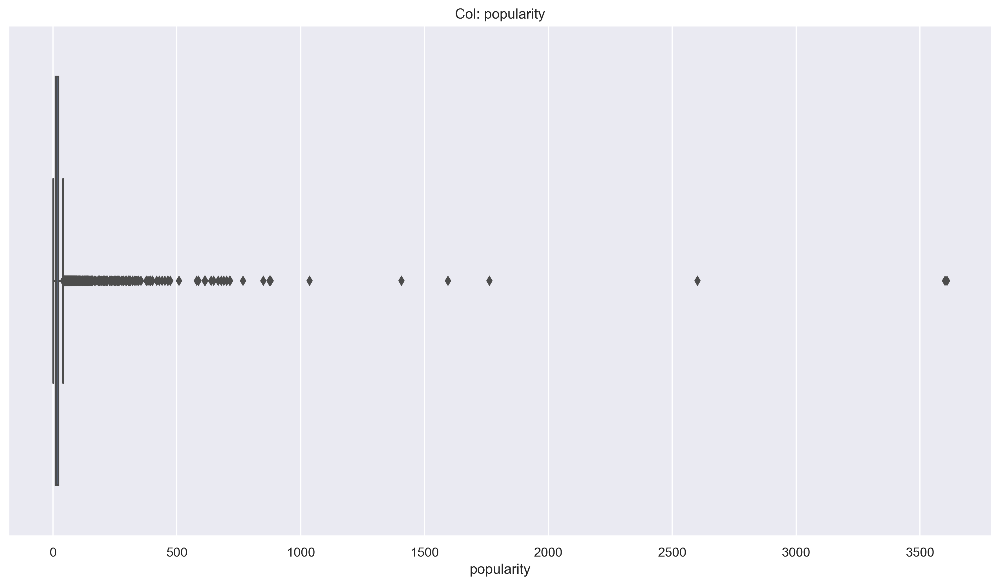

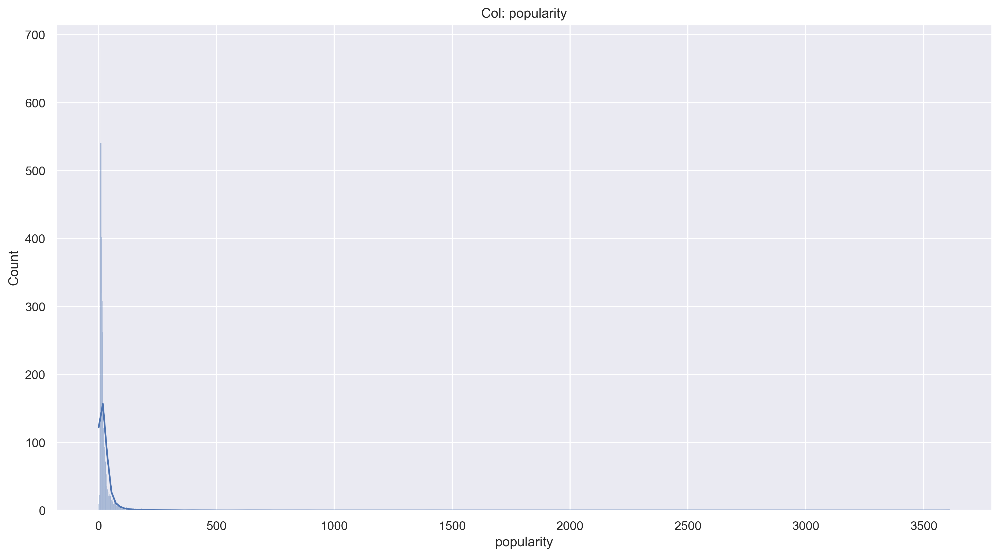

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


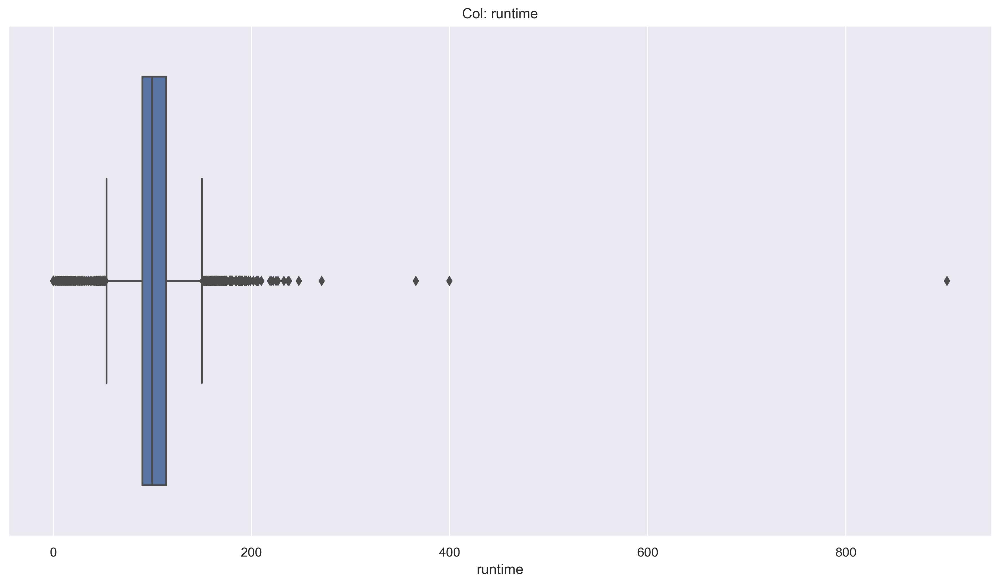

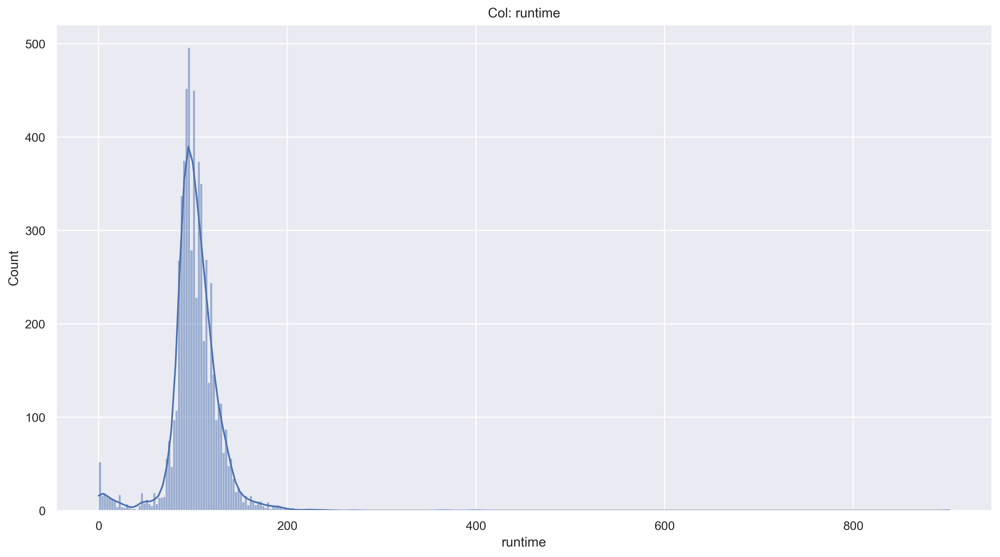

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


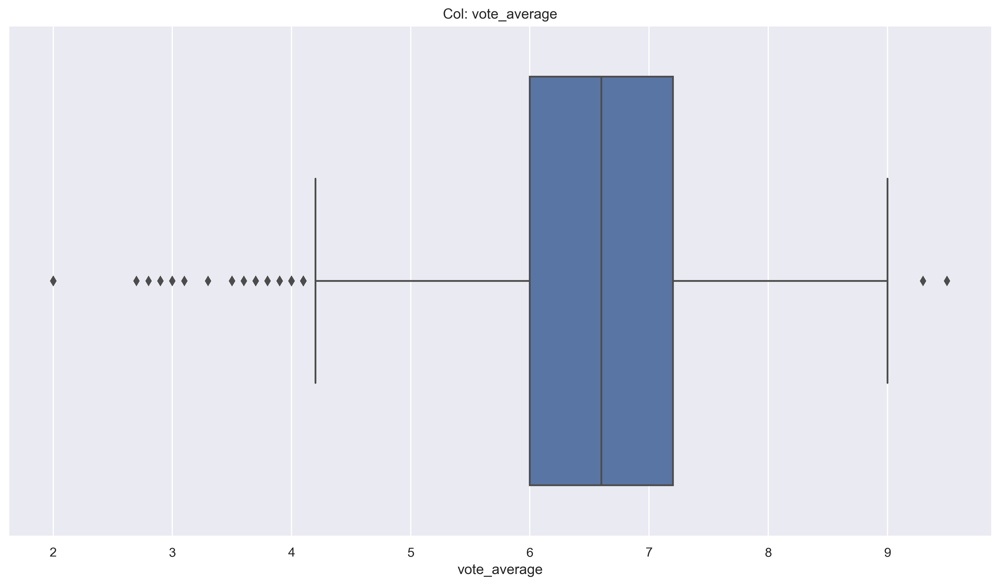

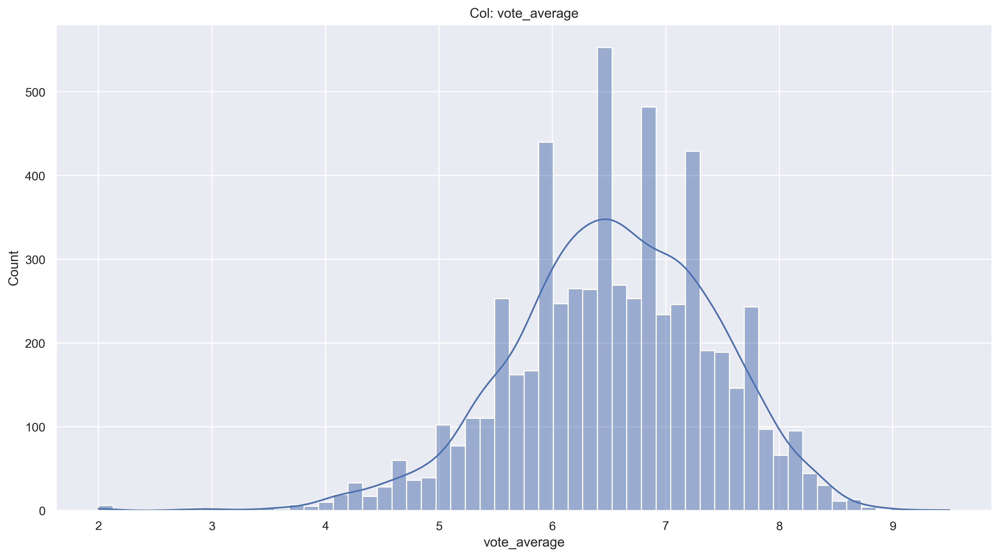

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


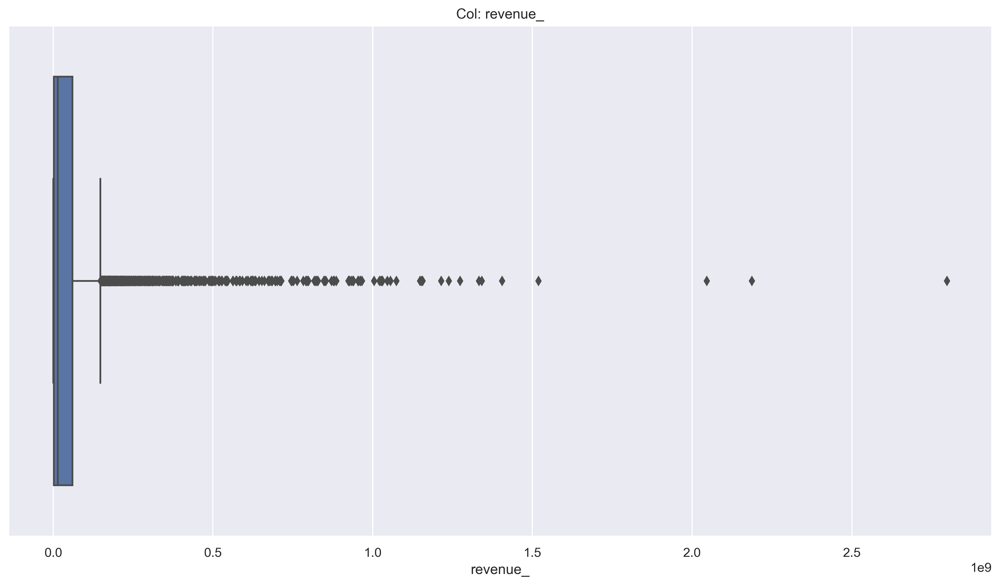

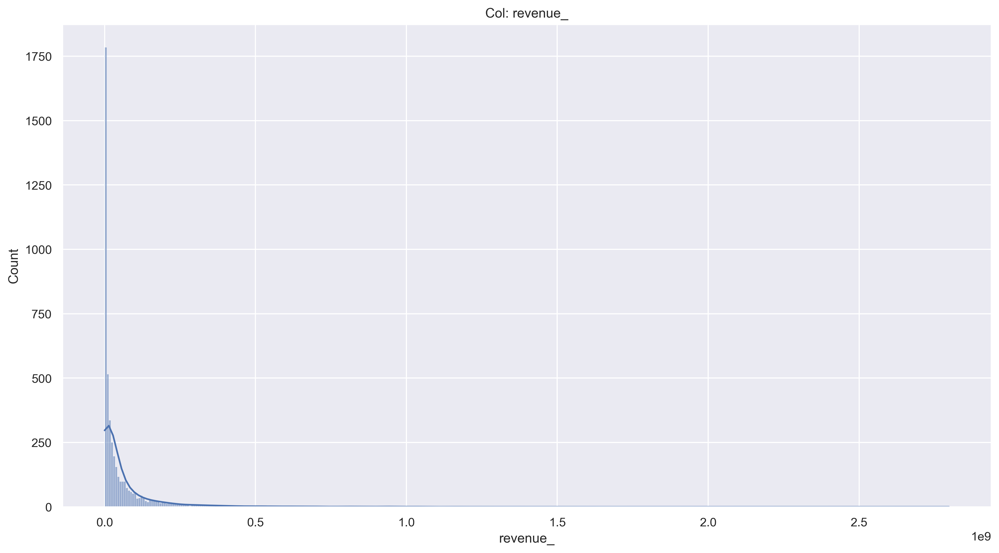

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


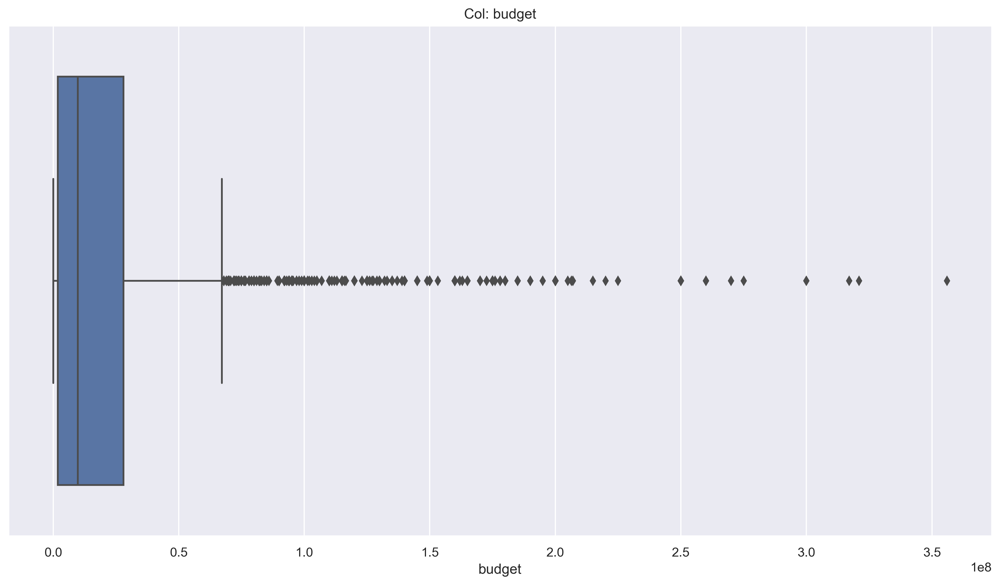

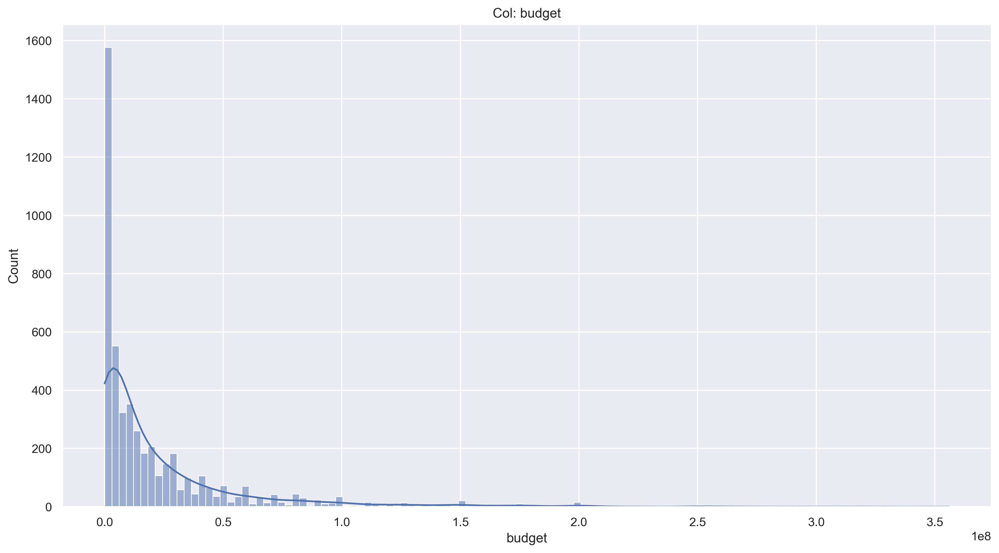

In [31]:
for col in nume_train_df.columns:
    sns.boxplot(nume_train_df[col])
    plt.title("Col: " + col)
    plt.show()

    sns.histplot(nume_train_df[col], kde = True)
    plt.title("Col: " + col)
    plt.show()


- Cột Popularity có thể sẽ bị bỏ do nó chỉ có tính thời điểm, phim hiện tại đang chiếu rạp sẽ có giá trị popularity cao nhất (**Pipeline step**)
- Target feature (revenue) bị right skew nên mình thử dùng phép biến đổi log xem sao 
- Những cột còn lại có vẻ bình thường nên hãy giữ nguyên

skewness: 5.976301598616513


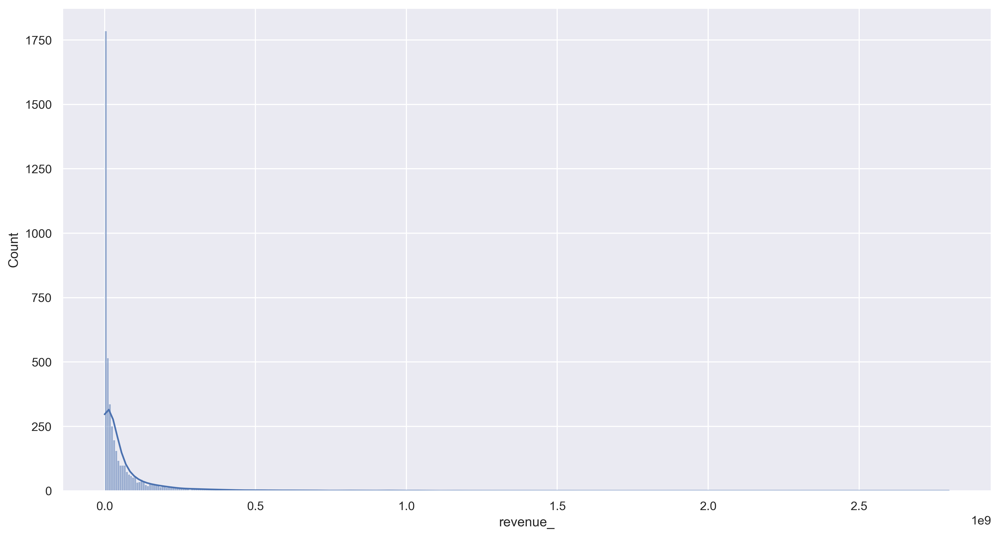

skewness: -1.0934037097401055


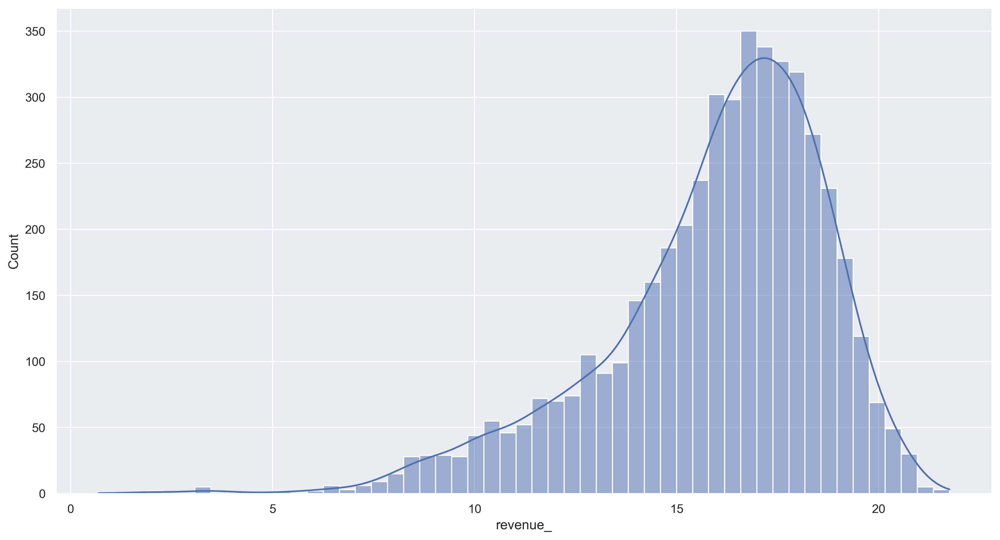

In [32]:
from scipy.stats import skew

sns.histplot(train_df['revenue_'], kde = True)
print(f"skewness: {skew(train_df['revenue_'].dropna())}")
plt.show()

sns.histplot(np.log1p(train_df['revenue_']), kde = True)
print(f"skewness: {skew(np.log1p(train_df['revenue_'].dropna()))}")
plt.show()

- Rõ ràng là tốt hơn rất nhiều mặc dù bây giờ revenue bị left skew nhẹ 

skewness: 3.170781375544528


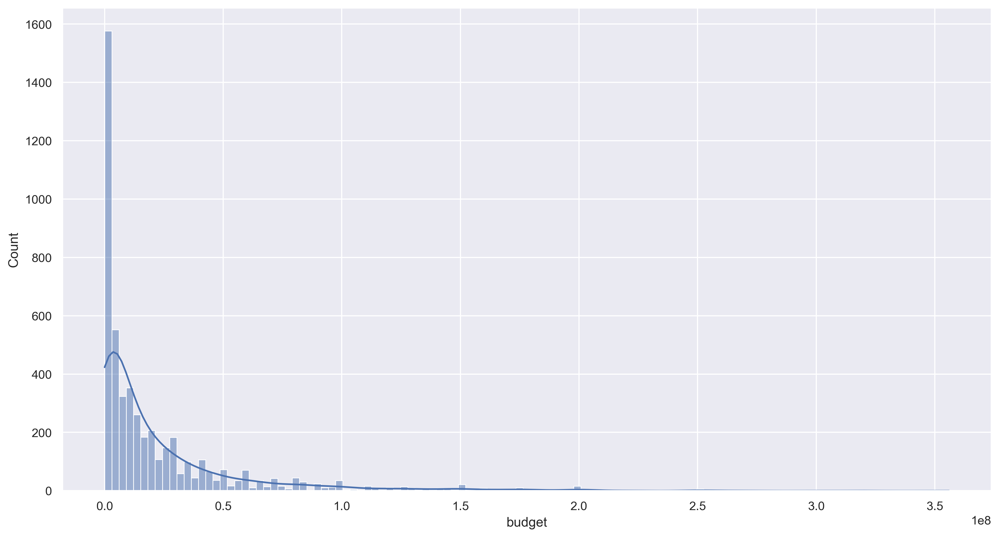

skewness: -1.2734445835868156


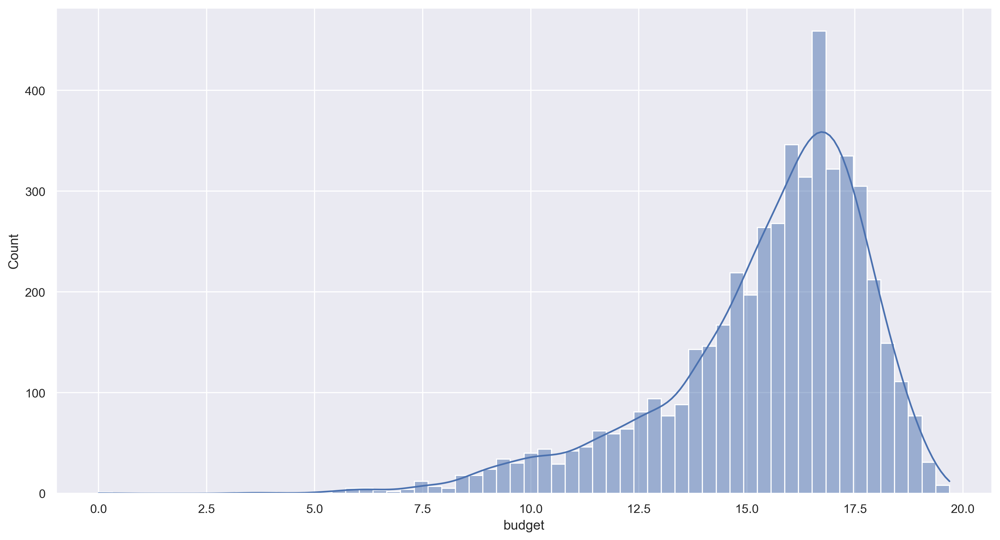

In [33]:
sns.histplot(train_df['budget'], kde = True)
print(f"skewness: {skew(train_df['budget'].dropna())}")
plt.show()

sns.histplot(np.log1p(train_df['budget']), kde = True)
print(f"skewness: {skew(np.log1p(train_df['budget'].dropna()))}")
plt.show()

- Tương tự điều này cũng xảy ra với budget nên mình tạo 2 feature mới (budget, revenue) dùng phép biến đổi log1p (phiên bản chính xác hơn log)

In [34]:
"""Pipeline step 0 (numericals cols): log1p"""

log_transformer = FunctionTransformer(np.log1p)

for dataset in [train_df, val_df, test_df]:
    dataset.loc[:, 'budget_log'] = log_transformer.transform(dataset['budget'])
    dataset.loc[:, 'revenue_log'] = log_transformer.transform(dataset['revenue_'])
# train_df['revenue_log'] = transformer.transform(train_df['revenue_'])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


##### Bivariate distribution

Budget and revenue

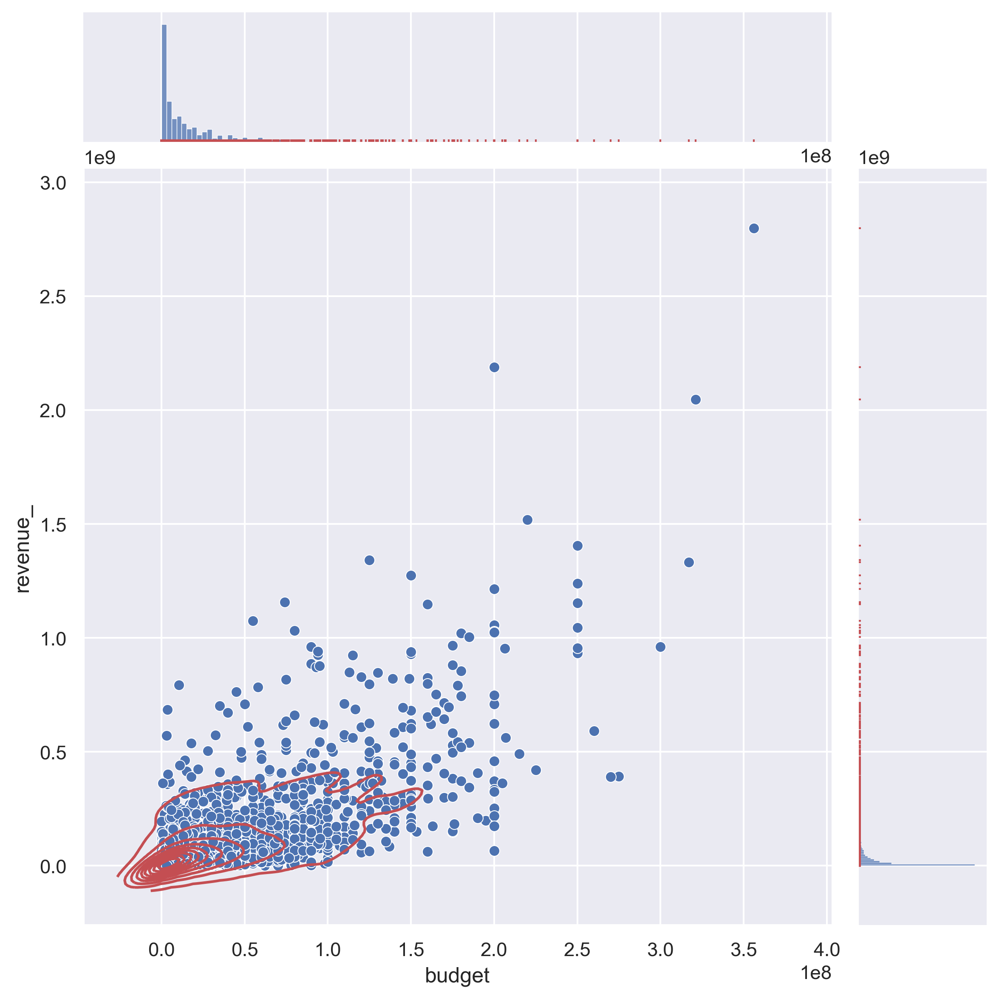

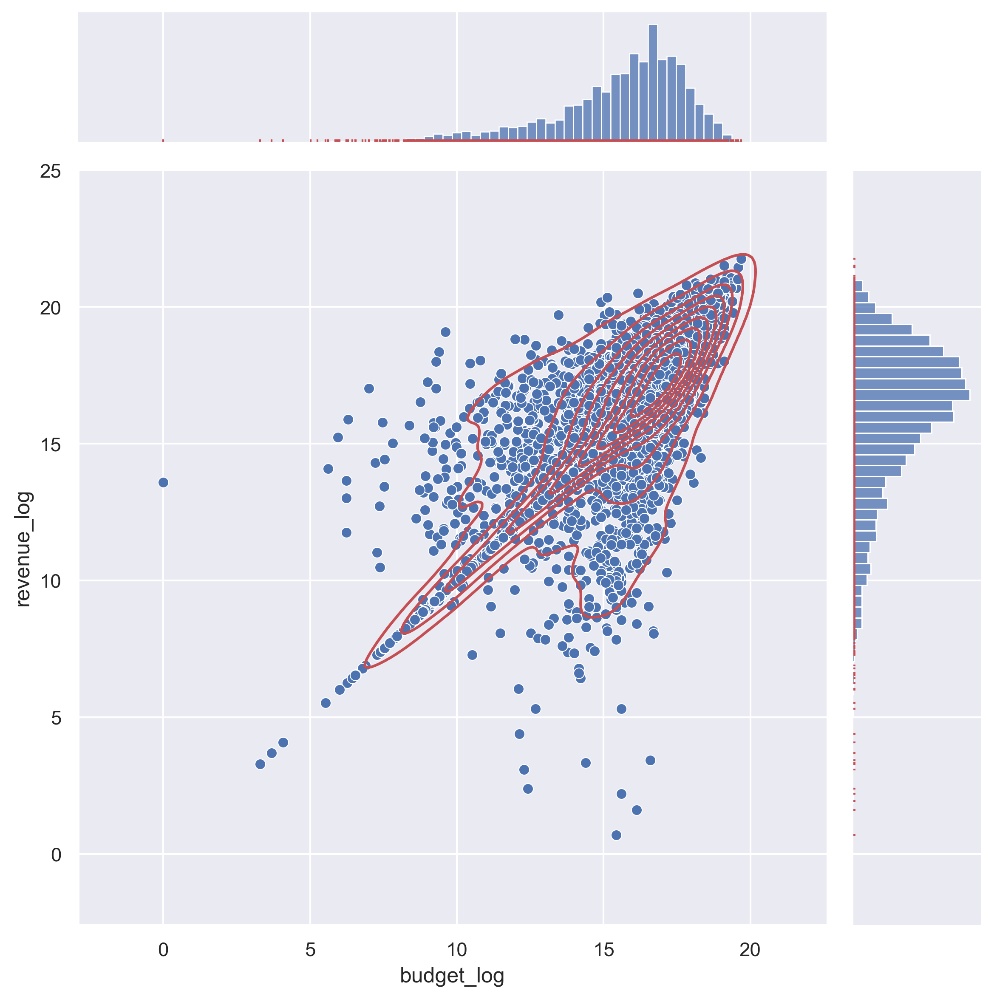

In [35]:
def joint_plot(data, x, y): 
    g = sns.jointplot(data=data, x=x, y=y, height = 8)
    g.plot_joint(sns.kdeplot, color="r")
    g.plot_marginals(sns.rugplot, color="r")
    plt.show()

joint_plot(train_df, 'budget', 'revenue_')
joint_plot(train_df, 'budget_log', 'revenue_log')

=> Tương quan tốt ở 2 feature này sau khi biến đổi log

---






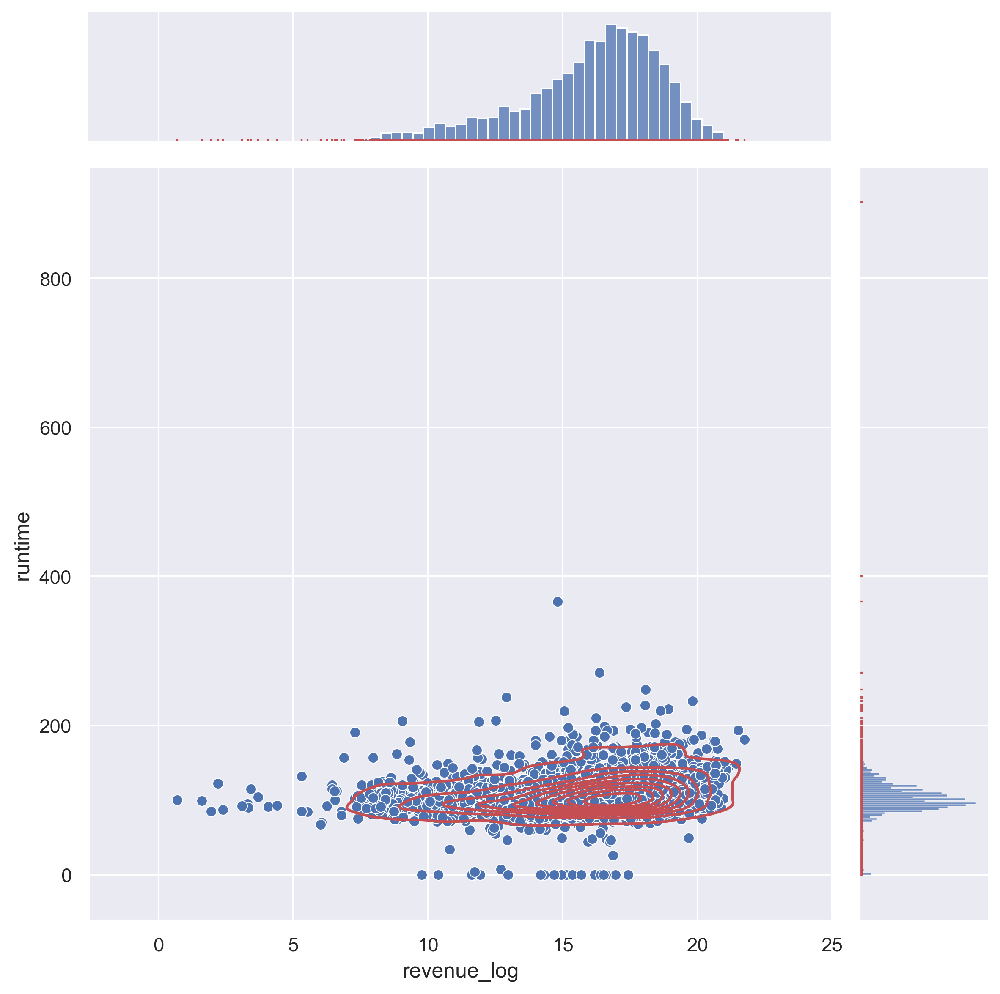

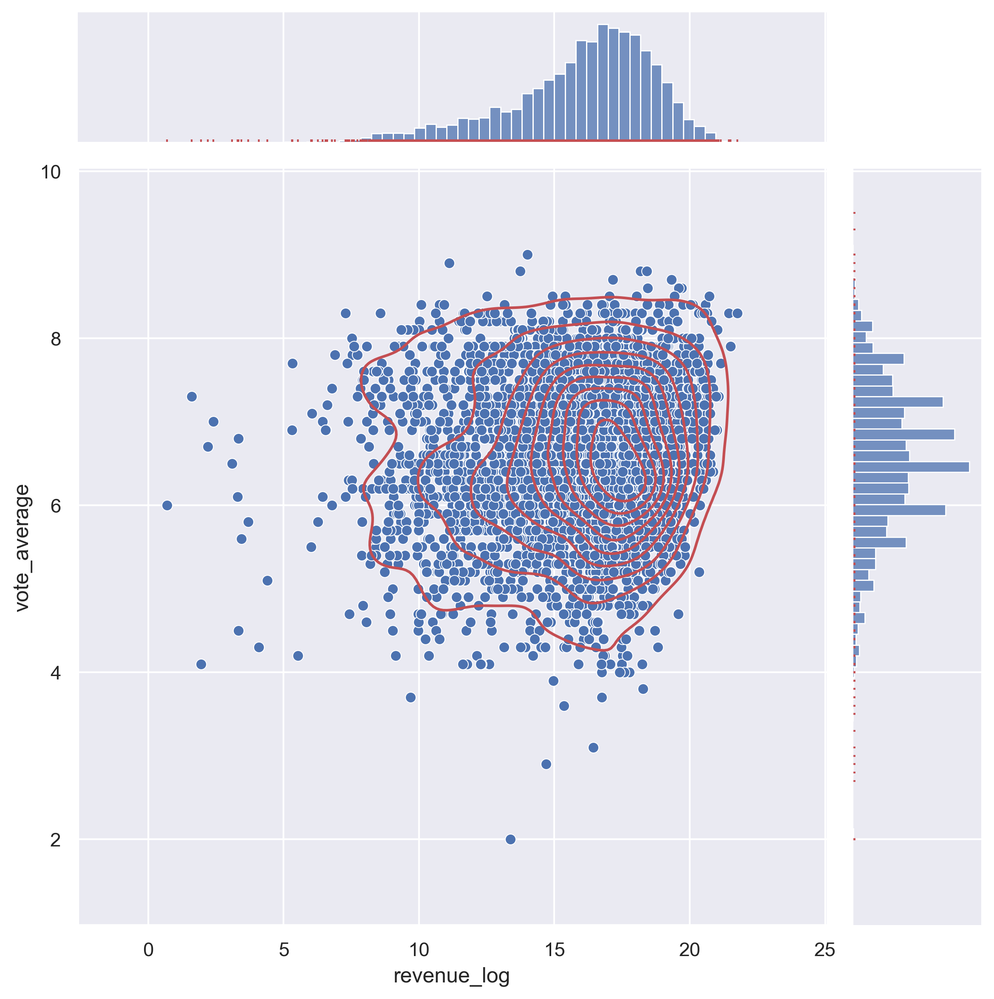

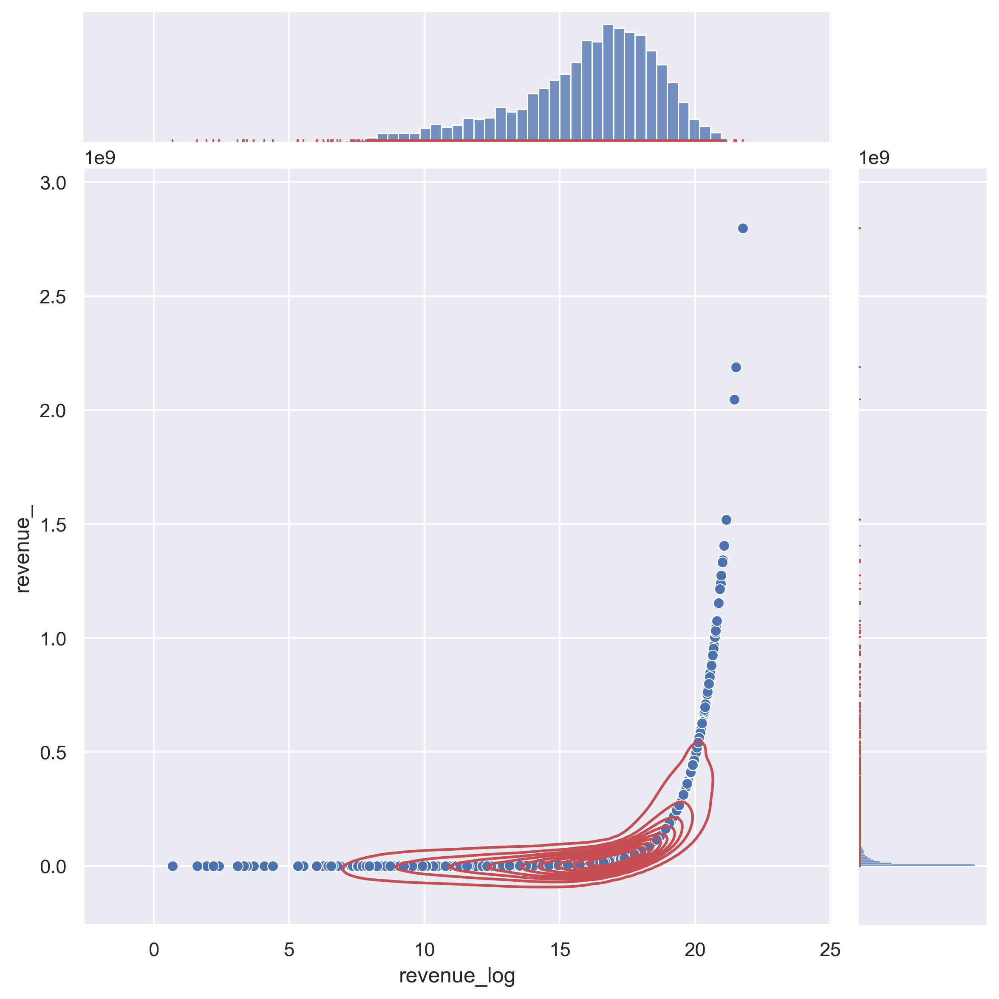

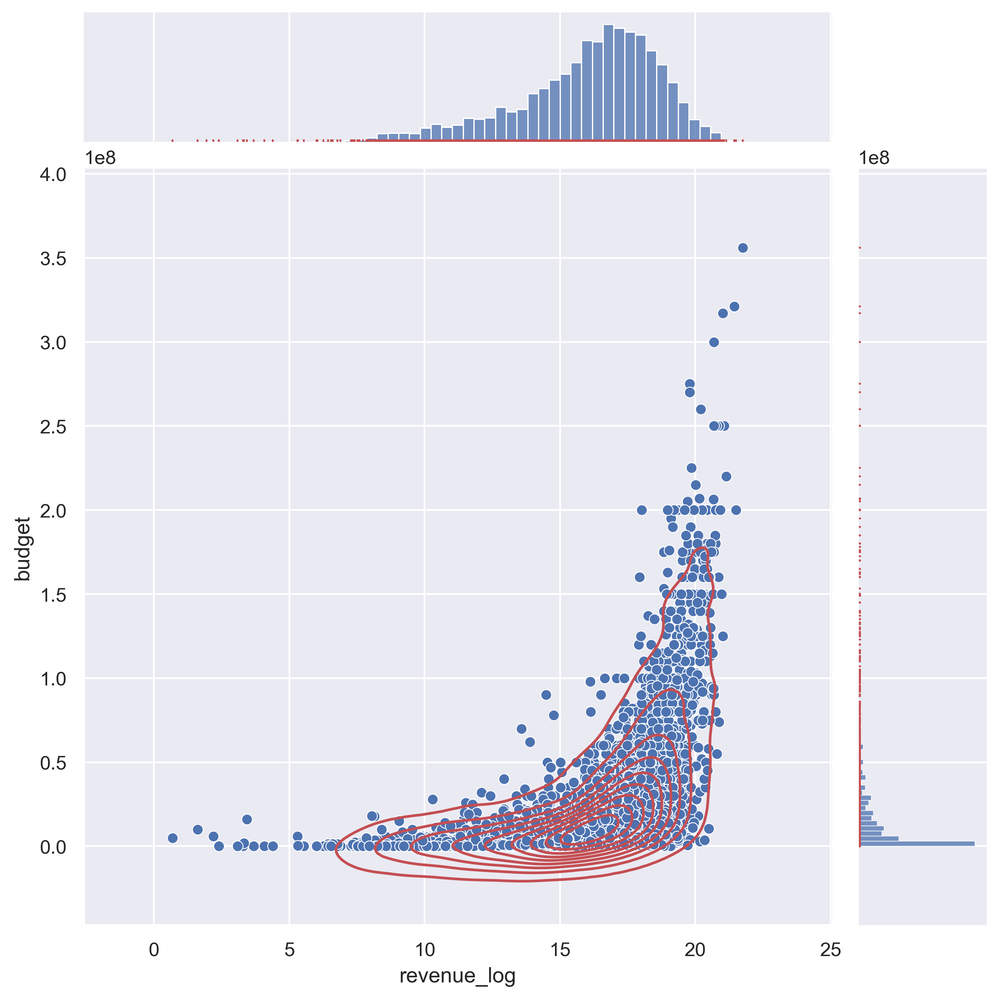

In [36]:
for col in nume_train_df.columns:
    if col != 'revenue_log' and col != 'popularity' and col != 'revenue':
        joint_plot(train_df, 'revenue_log', col)

##### Multivariate relationship

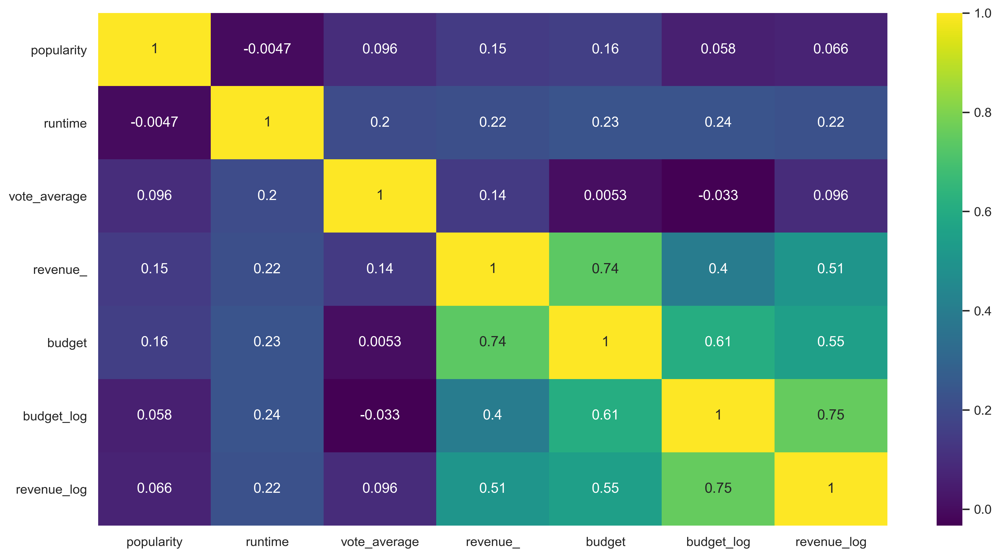

In [37]:
nume_train_df = train_df.select_dtypes(['int', 'float'])
sns.heatmap(nume_train_df.corr(), annot = True, cmap = 'viridis')

- `revenue_log` có quan hệ tuyến tính cao với `budget_log` và `budget`, `vote_count`

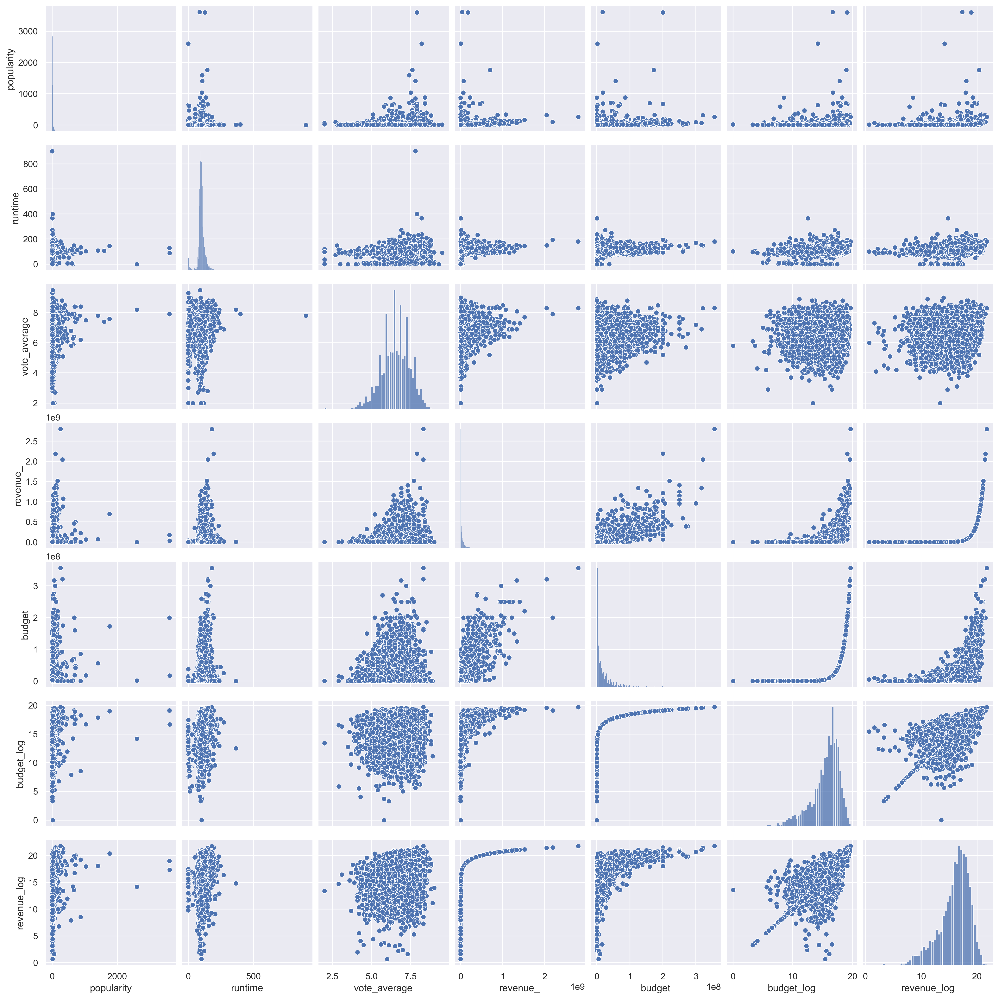

In [38]:
sns.pairplot(nume_train_df)
plt.show()

#### Explore categorical features

##### Distribution

##### Relationship

#### Combine Numerical + categorical features

#### Explore categorical features

##### Cleaning

In [39]:
cate_train_df = train_df.select_dtypes(['object', 'datetime'])
cate_train_df.columns

Index(['belongs_to_collection', 'genres', 'homepage', 'imdb_id',
       'original_language', 'original_title', 'overview', 'poster_path',
       'production_companies', 'production_countries', 'release_date',
       'spoken_languages', 'status', 'tagline', 'title', 'cast', 'crew',
       'keywords'],
      dtype='object')

In [40]:
cate_train_df.dropna().head(1)

,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,poster_path,production_companies,production_countries,release_date,spoken_languages,status,tagline,title,cast,crew,keywords
id,,,,,,,,,,,,,,,,,,
1371,"{'id': 1575, 'name': 'Rocky Collection', 'poster_path': '/O66XFv0mU6JKfmrgkoTQLwbFDG.jpg', 'backdrop_path': '/JhGydj4q5y8MoWZFyj15yKNrzC.jpg'}",[Drama],https://www.mgm.com/movies/rocky-iii,tt0084602,en,Rocky III,"Now the world champion, Rocky Balboa is living in luxury and only fighting opponents who pose no threat to him in the ring, until Clubber Lang challenges him to a bout. After taking a pounding from Lang, the humbled champ turns to former bitter rival Apollo Creed for a rematch with Lang.",/lklrplDDuALhY3k8IDFdRqtpZPk.jpg,"[Winkler Films, United Artists]",[United States of America],1982-05-28,[English],Released,The greatest challenge.,Rocky III,"[[Sylvester Stallone, 2, 25.404, Robert ""Rocky"" Balboa], [Talia Shire, 1, 13.447, Adrianna ""Adrian"" Balboa], [Burt Young, 2, 8.127, Paulie Pennino], [Carl Weathers, 2, 6.433, Apollo Creed], [Mr. T, 2, 4.199, Clubber Lang]]","[[Bill Butler, 2, 0.84, Director of Photography], [Sylvester Stallone, 2, 25.404, Screenplay], [Sylvester Stallone, 2, 25.404, Director]]","[transporter, trainer, boxer, dying and death, comeback, training, world champion, challenger, rematch, defeat, victory, sports, revenge, fame, wealth, boxing]"


==> Cột `cast`, `crew` cần được xử lý lại

###### Cast + crew
Get list of cast names, crew names

In [41]:
# list_of_cast_names = list(train_df['cast'])

""" Pipeline step: """
def list_of(temp, col, type):

    # Name of cast, crew
    if type == 'name':
        index = 0
    elif type == 'gender':
        index = 1
    elif type == 'character':
        index = 3

    def treat_cast1(casts):
        try:
            return [cast[index] for cast in casts]
        except:
            return np.nan

    def flatten_cast(list_of):
        res = []
        for movie in list_of:
            try:
                for cast in movie:
                    if cast == '':
                        res.append(np.nan)
                    else:
                        res.append(cast)
            except:
                continue

        return res

    list_of_names = list(temp[col].apply(treat_cast1))
    res = flatten_cast(list_of_names)
    list_of_names = dict(Counter(res))
    list_of_names = dict(sorted(list_of_names.items(), key=lambda item: item[1], reverse = True))
    return list_of_names

In [42]:
list_of_cast_names = list_of(train_df, 'cast', type = 'name')
print(list_of_cast_names)

{'Nicolas Cage': 41, 'Robert De Niro': 34, 'Bruce Willis': 31, 'Samuel L. Jackson': 30, 'Ed Harris': 27, 'Morgan Freeman': 27, 'Jackie Chan': 26, 'Johnny Depp': 25, 'Liam Neeson': 25, 'Julia Roberts': 25, 'Woody Harrelson': 25, 'Eddie Murphy': 25, 'John Leguizamo': 24, 'Scarlett Johansson': 24, 'Grey DeLisle': 24, 'Nicole Kidman': 24, 'Sylvester Stallone': 23, 'Matt Damon': 23, 'Julianne Moore': 23, 'Anthony Hopkins': 23, 'Gary Oldman': 23, 'Antonio Banderas': 23, 'Robin Williams': 23, 'Tom Hanks': 23, 'Brad Pitt': 23, 'Alec Baldwin': 22, 'Ewan McGregor': 22, 'Frank Welker': 22, 'Michael Caine': 22, 'Meryl Streep': 22, 'James Franco': 22, 'Will Ferrell': 22, 'Naomi Watts': 22, 'Ralph Fiennes': 21, 'Willem Dafoe': 21, 'Natalie Portman': 21, 'Jim Carrey': 21, 'Jude Law': 21, 'Harrison Ford': 21, 'Sam Rockwell': 21, 'Mark Wahlberg': 21, 'Clint Eastwood': 21, 'George Clooney': 21, 'Bill Murray': 20, 'Arnold Schwarzenegger': 20, 'Jean-Claude Van Damme': 20, 'Cameron Diaz': 20, 'Chris Evans'

In [43]:
print(len(list_of_cast_names))

15102


In [44]:
list_of_crew_names = list_of(train_df, 'crew', type = 'name')
print(list_of_crew_names)

{'Steven Soderbergh': 27, 'Luc Besson': 23, 'Roger Deakins': 23, 'Woody Allen': 21, 'Dean Cundey': 20, 'Billy Wilder': 19, 'Peter Deming': 19, 'Joel Coen': 19, 'Robert Rodriguez': 19, 'Clint Eastwood': 18, 'Robert Elswit': 18, 'Alfred Hitchcock': 18, 'Roman Polanski': 17, 'Francis Ford Coppola': 17, 'Neri Parenti': 17, 'Dean Semler': 16, 'David Tattersall': 16, 'Andrew Dunn': 16, 'Fausto Brizzi': 16, 'Akira Kurosawa': 16, 'Sylvester Stallone': 15, 'Terry Stacey': 15, 'Martin Scorsese': 15, 'Don Burgess': 15, 'Steven Spielberg': 15, 'Dariusz Wolski': 15, 'Richard Linklater': 15, 'John Toll': 15, 'Bill Pope': 15, 'John Lindley': 14, 'Robert D. Yeoman': 14, 'Robert Zemeckis': 14, 'Peter Jackson': 14, 'Matthew Libatique': 14, 'Michael Mann': 14, 'Barry Levinson': 14, 'Oliver Stapleton': 14, 'Emmanuel Lubezki': 14, 'Daryn Okada': 14, 'Wes Craven': 14, 'Andrzej Bartkowiak': 14, 'Philippe Rousselot': 14, 'Peter Hyams': 14, 'Donald McAlpine': 13, 'Dante Spinotti': 13, 'Peter Menzies Jr.': 13, 

In [45]:
print(len(list_of_crew_names))

8812


In [46]:
list_of_cast_names.keys()

dict_keys(['Nicolas Cage', 'Robert De Niro', 'Bruce Willis', 'Samuel L. Jackson', 'Ed Harris', 'Morgan Freeman', 'Jackie Chan', 'Johnny Depp', 'Liam Neeson', 'Julia Roberts', 'Woody Harrelson', 'Eddie Murphy', 'John Leguizamo', 'Scarlett Johansson', 'Grey DeLisle', 'Nicole Kidman', 'Sylvester Stallone', 'Matt Damon', 'Julianne Moore', 'Anthony Hopkins', 'Gary Oldman', 'Antonio Banderas', 'Robin Williams', 'Tom Hanks', 'Brad Pitt', 'Alec Baldwin', 'Ewan McGregor', 'Frank Welker', 'Michael Caine', 'Meryl Streep', 'James Franco', 'Will Ferrell', 'Naomi Watts', 'Ralph Fiennes', 'Willem Dafoe', 'Natalie Portman', 'Jim Carrey', 'Jude Law', 'Harrison Ford', 'Sam Rockwell', 'Mark Wahlberg', 'Clint Eastwood', 'George Clooney', 'Bill Murray', 'Arnold Schwarzenegger', 'Jean-Claude Van Damme', 'Cameron Diaz', 'Chris Evans', 'Susan Sarandon', 'Forest Whitaker', 'Robert Downey Jr.', 'Al Pacino', 'Colin Firth', 'Vincent Cassel', 'Jean Reno', 'Jeremy Irons', 'Kate Winslet', 'Matthew Lillard', 'Owen Wi

In [47]:
list_of_cast_gender = list_of(train_df, 'cast', type = 'gender')
list_of_crew_gender = list_of(train_df, 'crew', type = 'gender')
list_of_cast_characters = list_of(train_df, 'cast', type = 'character')
# list_of_crew_jobs = list_of(train_df, 'crew', type = 'job')

In [48]:
# Delete np.nan value
try:
    del list_of_cast_characters[np.nan]
except:
    pass


print(f"cast_gender: {list_of_cast_gender}")
print(f"crew_gender: {list_of_crew_gender}")
print(f"cast_characters: {list_of_cast_characters}")
# print(f"crew_jobs: {list_of_crew_jobs}")

cast_gender: {2: 17552, 1: 10553, 0: 1834, 3: 27}
crew_gender: {2: 13661, 0: 2776, 1: 1042, 3: 1}
cast_characters: {'Self': 168, 'Himself': 150, 'David': 43, 'Sam': 39, 'Herself': 38, 'Sarah': 33, 'Jack': 33, 'Michael': 31, 'Anna': 31, 'Ben': 30, 'Paul': 30, 'Alice': 29, 'Max': 29, 'Claire': 28, 'Alex': 26, 'Laura': 25, 'Lisa': 25, 'Frank': 25, 'Daniel': 24, 'Mary': 24, 'Maria': 23, 'Charlie': 23, 'Kate': 22, 'Sara': 21, 'John': 21, 'Mother': 20, 'Father': 20, 'Nick': 19, 'Marie': 19, 'Sophie': 19, 'Ray': 18, 'Gloria': 18, 'Emma': 18, 'Eva': 17, 'Luke': 17, 'Eddie': 17, 'Eric': 17, 'Dan': 17, 'Mike': 17, 'Chris': 17, 'Henry': 16, 'Angela': 16, 'Charlotte': 16, 'Tony': 16, 'Julia': 16, 'James Bond': 16, 'Narrator (voice)': 16, 'Jake': 16, 'Kelly': 15, 'Beth': 15, 'Rebecca': 15, 'Rachel': 15, 'Joe': 15, 'Katie': 15, 'Pikachu (voice)': 15, 'Josh': 15, 'Michelle': 14, 'Adam': 14, 'Maggie': 14, 'Jessica': 14, 'James': 14, 'Bob': 14, 'Tom': 14, 'Jimmy': 14, 'Thomas': 14, 'Julie': 14, 'Bruno'

One hot encoding cast, crew name

In [49]:
""" Pipeline step """
one_hot_len = 100
# for name in list(list_of_cast_names)[:one_hot_len]:
#     temp['cast_name_' + name] = train_df['cast'].apply(lambda x: 1 if name in str(x) else 0)

# for name in list(list_of_crew_names)[:one_hot_len]:
#     temp['crew_name_' + name] = train_df['crew'].apply(lambda x: 1 if name in str(x) else 0)

# display(temp.head())

for dataset in [train_df, val_df, test_df]:
    for name in list(list_of_cast_names)[:one_hot_len]:
        dataset['cast_name_' + name] = dataset['cast'].apply(lambda x: 1 if name in str(x) else 0)

    for name in list(list_of_crew_names)[:one_hot_len]:
        dataset['crew_name_' + name] = dataset['crew'].apply(lambda x: 1 if name in str(x) else 0)

print(train_df.shape, val_df.shape, test_df.shape)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


(6099, 228) (2440, 228) (3660, 228)


In [50]:
pd.set_option('display.max_colwidth', 15)
display(train_df.head())
display(val_df.head())
display(test_df.head())

,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_Peter Suschitzky,crew_name_John Carpenter,crew_name_Julio Macat,crew_name_Javier Aguirresarobe,crew_name_Rob Reiner,crew_name_Guillermo del Toro,crew_name_Michael Ballhaus,crew_name_Ron Howard,crew_name_François Ozon,crew_name_Terrence Malick
id,,,,,,,,,,,,,,,,,,,,,
554577,False,NaN,"[Crime, Thr...",NaN,tt4707274,es,El Complot ...,"1963, the S...",16.945,/d3C9oEpe4a...,...,0,0,0,0,0,0,0,0,0,0
401246,False,NaN,[Drama],https://www...,tt4995790,en,The Square,A prestigio...,13.091,/fNiNwjbYDc...,...,0,0,0,0,0,0,0,0,0,0
430,False,NaN,"[Comedy, Fa...",NaN,tt0055256,en,"One, Two, T...",C.R. MacNam...,8.454,/dtuhPaLAm1...,...,0,0,0,0,0,0,0,0,0,0
13252,False,NaN,"[Crime, Thr...",NaN,tt0896798,en,Cleaner,Single fath...,8.910,/tsFKQu5HXW...,...,0,0,0,0,0,0,0,0,0,0
11121,False,NaN,"[Drama, Rom...",NaN,tt0080009,en,Tess,A strong-wi...,11.735,/m2qx66UNTM...,...,0,0,0,0,0,0,0,0,0,0


,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_Peter Suschitzky,crew_name_John Carpenter,crew_name_Julio Macat,crew_name_Javier Aguirresarobe,crew_name_Rob Reiner,crew_name_Guillermo del Toro,crew_name_Michael Ballhaus,crew_name_Ron Howard,crew_name_François Ozon,crew_name_Terrence Malick
id,,,,,,,,,,,,,,,,,,,,,
384677,False,NaN,"[Romance, C...",https://www...,tt5304992,en,Set It Up,Two overwor...,16.134,/XF5jV0UxKn...,...,0,0,0,0,0,0,0,0,0,0
11309,False,NaN,[Science Fi...,NaN,tt0099740,en,Hardware,Mark 13 is ...,6.371,/sqGxlSRvDV...,...,0,0,0,0,0,0,0,0,0,0
229,False,{'id': 2184...,"[Drama, Hor...",NaN,tt0026138,en,The Bride o...,Bride of Fr...,11.336,/5241zUwe7r...,...,0,0,0,0,0,0,0,0,0,0
4954,False,NaN,"[Action, Th...",NaN,tt0109676,en,Drop Zone,A team of s...,9.516,/bbveyfmq6p...,...,0,0,0,0,0,0,0,0,0,0
6519,False,{'id': 3323...,"[Comedy, Ad...",http://www....,tt0377818,en,The Dukes o...,"Cousins, Bo...",12.934,/o5pKtw26jE...,...,0,0,0,0,0,0,0,0,0,0


,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_Peter Suschitzky,crew_name_John Carpenter,crew_name_Julio Macat,crew_name_Javier Aguirresarobe,crew_name_Rob Reiner,crew_name_Guillermo del Toro,crew_name_Michael Ballhaus,crew_name_Ron Howard,crew_name_François Ozon,crew_name_Terrence Malick
id,,,,,,,,,,,,,,,,,,,,,
417320,False,{'id': 4664...,"[Family, Fa...",NaN,tt5117876,en,Descendants 2,When the pr...,38.808,/8BNyZlBk4H...,...,0,0,0,0,0,0,0,0,0,0
347969,False,NaN,"[Western, C...",http://www....,tt2479478,en,The Ridicul...,When his lo...,32.863,/kPc80jywR5...,...,0,0,0,0,0,0,0,0,0,0
65,False,NaN,"[Music, Drama]",https://www...,tt0298203,en,8 Mile,The setting...,32.057,/7BmQj8qE1F...,...,0,0,0,0,0,0,0,0,0,0
98,False,NaN,"[Action, Dr...",NaN,tt0172495,en,Gladiator,In the year...,40.360,/ehGpN04mLJ...,...,0,0,0,0,0,0,0,0,0,0
819,False,NaN,"[Crime, Dra...",NaN,tt0117665,en,Sleepers,Two gangste...,18.690,/yUpiEk2Eoj...,...,0,0,0,0,0,0,1,0,0,0


In [51]:
top_list_names = []
values_top_list = []
one_hot_len_t = 10
for name in list(list_of_cast_names)[:one_hot_len_t]:
    top_list_names.append(name)
    values_top_list.append(list_of_cast_names[name])
top_list_names    

['Nicolas Cage',
 'Robert De Niro',
 'Bruce Willis',
 'Samuel L. Jackson',
 'Ed Harris',
 'Morgan Freeman',
 'Jackie Chan',
 'Johnny Depp',
 'Liam Neeson',
 'Julia Roberts']

In [52]:
values_top_list

[41, 34, 31, 30, 27, 27, 26, 25, 25, 25]

Gender sum

Với mỗi phim, đếm tổng số người có giới tính x (x đi từ 0 -> 3) cho cast và crew 

In [53]:
""" Pipeline step"""
def count_gender(casts, val):
    count = 0
    try:
        for cast in casts:
            if cast[1] == val:
                count += 1
    except:
        return 0

    return count
    
for temp in [train_df, val_df, test_df]:
    # unidentified
    temp.loc[:, 'gender_cast_0'] = train_df['cast'].apply(lambda x: count_gender(x, 0))
    temp.loc[:, 'gender_cast_1'] = train_df['cast'].apply(lambda x: count_gender(x, 1))
    temp.loc[:, 'gender_cast_2'] = train_df['cast'].apply(lambda x: count_gender(x, 2))

    # LGBT confirmed !
    temp.loc[:, 'gender_cast_3'] = train_df['cast'].apply(lambda x: count_gender(x, 3))

    temp.loc[:, 'gender_crew_0'] = train_df['crew'].apply(lambda x: count_gender(x, 0))
    temp.loc[:, 'gender_crew_1'] = train_df['crew'].apply(lambda x: count_gender(x, 1))
    temp.loc[:, 'gender_crew_2'] = train_df['crew'].apply(lambda x: count_gender(x, 2))

    temp.loc[:, 'gender_crew_3'] = train_df['crew'].apply(lambda x: count_gender(x, 0))
    display(temp.head())

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_François Ozon,crew_name_Terrence Malick,gender_cast_0,gender_cast_1,gender_cast_2,gender_cast_3,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3
id,,,,,,,,,,,,,,,,,,,,,
554577,False,NaN,"[Crime, Thr...",NaN,tt4707274,es,El Complot ...,"1963, the S...",16.945,/d3C9oEpe4a...,...,0,0,0,1,4,0,0,0,2,0
401246,False,NaN,[Drama],https://www...,tt4995790,en,The Square,A prestigio...,13.091,/fNiNwjbYDc...,...,0,0,0,1,4,0,1,0,1,1
430,False,NaN,"[Comedy, Fa...",NaN,tt0055256,en,"One, Two, T...",C.R. MacNam...,8.454,/dtuhPaLAm1...,...,0,0,0,2,3,0,0,0,4,0
13252,False,NaN,"[Crime, Thr...",NaN,tt0896798,en,Cleaner,Single fath...,8.910,/tsFKQu5HXW...,...,0,0,0,2,3,0,0,0,2,0
11121,False,NaN,"[Drama, Rom...",NaN,tt0080009,en,Tess,A strong-wi...,11.735,/m2qx66UNTM...,...,0,0,0,2,3,0,0,0,5,0


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_François Ozon,crew_name_Terrence Malick,gender_cast_0,gender_cast_1,gender_cast_2,gender_cast_3,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3
id,,,,,,,,,,,,,,,,,,,,,
384677,False,NaN,"[Romance, C...",https://www...,tt5304992,en,Set It Up,Two overwor...,16.134,/XF5jV0UxKn...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11309,False,NaN,[Science Fi...,NaN,tt0099740,en,Hardware,Mark 13 is ...,6.371,/sqGxlSRvDV...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
229,False,{'id': 2184...,"[Drama, Hor...",NaN,tt0026138,en,The Bride o...,Bride of Fr...,11.336,/5241zUwe7r...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4954,False,NaN,"[Action, Th...",NaN,tt0109676,en,Drop Zone,A team of s...,9.516,/bbveyfmq6p...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6519,False,{'id': 3323...,"[Comedy, Ad...",http://www....,tt0377818,en,The Dukes o...,"Cousins, Bo...",12.934,/o5pKtw26jE...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,adult,belongs_to_collection,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,crew_name_François Ozon,crew_name_Terrence Malick,gender_cast_0,gender_cast_1,gender_cast_2,gender_cast_3,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3
id,,,,,,,,,,,,,,,,,,,,,
417320,False,{'id': 4664...,"[Family, Fa...",NaN,tt5117876,en,Descendants 2,When the pr...,38.808,/8BNyZlBk4H...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
347969,False,NaN,"[Western, C...",http://www....,tt2479478,en,The Ridicul...,When his lo...,32.863,/kPc80jywR5...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,False,NaN,"[Music, Drama]",https://www...,tt0298203,en,8 Mile,The setting...,32.057,/7BmQj8qE1F...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,False,NaN,"[Action, Dr...",NaN,tt0172495,en,Gladiator,In the year...,40.360,/ehGpN04mLJ...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
819,False,NaN,"[Crime, Dra...",NaN,tt0117665,en,Sleepers,Two gangste...,18.690,/yUpiEk2Eoj...,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###### Homepage

Homepage 1: có, 0: không

In [54]:
"""Pipeline step"""

for temp in [train_df, val_df, test_df]:
    temp.loc[:, 'has_homepage'] = temp['homepage'].apply(lambda x: 0 if pd.isna(x) else 1).values
    display(temp.iloc[:, -5:])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3,has_homepage
id,,,,,
554577,0,0,2,0,0
401246,1,0,1,1,1
430,0,0,4,0,0
13252,0,0,2,0,0
11121,0,0,5,0,0
...,...,...,...,...,...
8072,0,0,3,0,0
659699,1,0,2,1,0
646621,1,0,0,1,0


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3,has_homepage
id,,,,,
384677,NaN,NaN,NaN,NaN,1
11309,NaN,NaN,NaN,NaN,0
229,NaN,NaN,NaN,NaN,0
4954,NaN,NaN,NaN,NaN,0
6519,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...
496349,NaN,NaN,NaN,NaN,0
398173,NaN,NaN,NaN,NaN,1
353610,NaN,NaN,NaN,NaN,0


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,gender_crew_0,gender_crew_1,gender_crew_2,gender_crew_3,has_homepage
id,,,,,
417320,NaN,NaN,NaN,NaN,0
347969,NaN,NaN,NaN,NaN,1
65,NaN,NaN,NaN,NaN,1
98,NaN,NaN,NaN,NaN,0
819,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...
441168,NaN,NaN,NaN,NaN,1
14522,NaN,NaN,NaN,NaN,0
530581,NaN,NaN,NaN,NaN,0


###### Belongs_to_collection

In [55]:
train_df['belongs_to_collection'].isnull().mean()

0.76504344974586

- Cột 1 (collection_name): tên collection
- Cột 2 (has_collection): boolean 1 có 0 không

In [56]:
temp = train_df.copy()
for temp in [train_df, val_df, test_df]:
    temp['has_collection'] = temp['belongs_to_collection'].apply(lambda x: 0 if pd.isna(x) else 1)
    temp['collection_name'] = temp['belongs_to_collection'].apply(lambda x: 0 if pd.isna(x) else x)

print(train_df.shape, val_df.shape, test_df.shape)

(6099, 239) (2440, 239) (3660, 239)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


###### Genres

- Cột 1 (genres_quantity): Số genres mà mỗi phim có

In [58]:
temp = train_df.copy()

# Let's test and see the result here
temp['genres_quantity'] = temp['genres'].apply(lambda x: len(x) if type(x) == list else 0)
display(temp[['genres_quantity', 'genres']])
display(temp['genres_quantity'].value_counts())

,genres_quantity,genres
id,,
554577,2,"[Crime, Thr..."
401246,1,[Drama]
430,2,"[Comedy, Fa..."
13252,3,"[Crime, Thr..."
11121,2,"[Drama, Rom..."
...,...,...
8072,3,"[Drama, Sci..."
659699,1,[Comedy]
646621,2,"[Comedy, Ro..."


3    1906
2    1898
1    1207
4     769
5     226
6      58
0      24
7       8
8       3
Name: genres_quantity, dtype: int64

- Cột 2 (genres_all): join string của genres bằng " " lại (VD: "romance comedy drama") và sort theo alphabet. 
Sau đó dùng Ordinal encoder để đưa các chuỗi này về số (đã theo thứ tự alphabet)
- Lí do dùng ordinal encoder vì nếu tổng hợp các nhiều thể loại lại với nhau thì lại tạo ra 1 bộ phim với thể loại mới 
$\Rightarrow$ Phim với nhiều thể loại thì sẽ hấp dẫn hơn nên mình thực hiện ordinal encoding

In [59]:
from sklearn.preprocessing import OrdinalEncoder

# Create encoder
le = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

# Genres from train set
temp['genres_all'] = temp['genres'].apply(lambda x: " ".join(sorted(x)) if type(x) == list else "")
temp['genres_all'].value_counts()

Comedy                                420
Drama                                 395
Drama Romance                         209
Comedy Drama                          186
Comedy Romance                        176
                                     ... 
Adventure History                       1
Adventure Comedy Drama History          1
Action Adventure Drama Romance War      1
Adventure Comedy Music                  1
Comedy Drama Family Fantasy Music       1
Name: genres_all, Length: 817, dtype: int64

In [60]:
# Fit on train
le.fit(temp['genres_all'].values.reshape(-1, 1))

# Test encoder here
temp['genres_all'] = le.transform(temp['genres_all'].values.reshape(-1, 1)).astype('int')

temp['genres_all']

id
554577    647
401246    657
430       553
13252     643
11121     727
         ... 
8072      722
659699    490
646621    595
58431     583
8052      634
Name: genres_all, Length: 6099, dtype: int32

=> Kết quả trả về là tương ứng với bảng tần suất ở trên

Thực hiện clean `genres` trên toàn bộ data

##### Handling missing values

#### Handling outliers

#### Generate new features

#### Scaling features

#### Normalization

#### Categorical --> Numerical

#### Features selection

#### Cleaning Pipelines

# Model selection

# Hyperparameters tuning

# Evaluation

# References

- Cleaning steps https://towardsdatascience.com/the-ultimate-guide-to-data-cleaning-3969843991d4
- EDA + features engineering:
    - https://www.kaggle.com/kamalchhirang/eda-feature-engineering-lgb-xgb-cat
    - https://www.kaggle.com/enric1296/complete-guide-eda-feat-model
    - https://www.kaggle.com/artgor/eda-feature-engineering-and-model-interpretation#Modelling-and-feature-generation
    - https://www.kaggle.com/takedown/tmdb-box-office-revenue-prediction